# PI 2

### Modelo que estime el comportamiento crediticio esperado

Presentado por:

* Juan Esteban Chavarria
* Jonathan Zapata
* Karla Orozo
* Juan Fernando Gallego

# Análisis Exploratorio

## Importar librerías

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from scipy.stats import kurtosis

## Cargar datos

In [ ]:
data_behavior = pd.read_excel('data_ok.xlsx', sheet_name='Sheet1')

In [ ]:
#Guardar una copia
backup = data_behavior.copy()

In [ ]:
#data_behavior = backup.copy()

## Observar datos

In [ ]:
len(backup)

39032

In [ ]:
backup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39032 entries, 0 to 39031
Data columns (total 46 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   MONTO_CRED_ACTUAL                   39032 non-null  float64       
 1   N_MES_POND_ACTUAL                   39032 non-null  float64       
 2   CUOTAS_MES_ACTUAL                   39032 non-null  float64       
 3   CONSUMO_N_REST_MES_POND_ANTERIOR    39032 non-null  float64       
 4   VEHICULO_N_REST_MES_POND_ANTERIOR   39032 non-null  float64       
 5   VIVIENDA_N_REST_MES_POND_ANTERIOR   39032 non-null  float64       
 6   SEGUROS_N_REST_MES_POND_ANTERIOR    39032 non-null  float64       
 7   ROTATIVOS_N_REST_MES_POND_ANTERIOR  39032 non-null  float64       
 8   CONSUMO_SALDO_CRED_MES_ANTERIOR     39032 non-null  float64       
 9   VEHICULO_SALDO_CRED_MES_ANTERIOR    39032 non-null  float64       
 10  VIVIENDA_SALDO_CRED_ME

In [ ]:
data_behavior.head()

,MONTO_CRED_ACTUAL,N_MES_POND_ACTUAL,CUOTAS_MES_ACTUAL,CONSUMO_N_REST_MES_POND_ANTERIOR,VEHICULO_N_REST_MES_POND_ANTERIOR,VIVIENDA_N_REST_MES_POND_ANTERIOR,SEGUROS_N_REST_MES_POND_ANTERIOR,ROTATIVOS_N_REST_MES_POND_ANTERIOR,CONSUMO_SALDO_CRED_MES_ANTERIOR,VEHICULO_SALDO_CRED_MES_ANTERIOR,...,I_SEXO,I_ESTCIV,INFO_CIFIN,PROP_RET_HIST_X_EDAD,PROP_RET_HIST_X_EDAD_SAL,CAL_MAX_CICLO,CICLO,Unnamed: 43,Unnamed: 44,Unnamed: 45
0,-0.148155,1.166840,-0.036489,-0.984734,-0.128912,-0.248943,-0.375325,-1.577202,-0.336197,-0.106221,...,M,S,True,0.591078,0.510517,A,F,NaN,NaN,NaN
1,-0.187780,-0.982121,-0.038112,-0.984734,-0.128912,2.707392,0.903087,-1.577202,-0.336197,-0.106221,...,F,S,True,0.591078,0.064347,A,F,NaN,NaN,NaN
2,-0.144755,0.269882,-0.034912,-0.984734,-0.128912,-0.248943,-0.375325,-1.577202,-0.336197,-0.106221,...,M,C,True,0.095655,0.036192,A,F,NaN,NaN,NaN
3,0.234395,0.718361,0.001791,1.690812,-0.128912,-0.248943,-0.375325,1.092118,-0.160900,-0.106221,...,F,U,True,0.260536,0.160223,E,F-I,NaN,NaN,NaN
4,-0.163801,-0.627075,-0.032066,-0.984734,-0.128912,-0.248943,-0.375325,0.939480,-0.336197,-0.106221,...,F,S,True,0.591078,0.510517,A,F,NaN,NaN,NaN


In [ ]:
_deepnote_run_altair(data_behavior, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"bar","tooltip":true},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"ANTIGÜEDAD","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}},"y":{"field":"EDAD","type":"quantitative","sort":null,"scale":{"type":"linear","zero":true}},"color":{"field":"ANTIGÜEDAD","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

In [ ]:
data_behavior.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39032 entries, 0 to 39031
Data columns (total 46 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   MONTO_CRED_ACTUAL                   39032 non-null  float64       
 1   N_MES_POND_ACTUAL                   39032 non-null  float64       
 2   CUOTAS_MES_ACTUAL                   39032 non-null  float64       
 3   CONSUMO_N_REST_MES_POND_ANTERIOR    39032 non-null  float64       
 4   VEHICULO_N_REST_MES_POND_ANTERIOR   39032 non-null  float64       
 5   VIVIENDA_N_REST_MES_POND_ANTERIOR   39032 non-null  float64       
 6   SEGUROS_N_REST_MES_POND_ANTERIOR    39032 non-null  float64       
 7   ROTATIVOS_N_REST_MES_POND_ANTERIOR  39032 non-null  float64       
 8   CONSUMO_SALDO_CRED_MES_ANTERIOR     39032 non-null  float64       
 9   VEHICULO_SALDO_CRED_MES_ANTERIOR    39032 non-null  float64       
 10  VIVIENDA_SALDO_CRED_ME

#Examinar en una tabla cruzada de las variables de su comportamiento
pd.crosstab(data_behavior.Y, data_behavior.TIPO_ACTUAL)

#No será considerado en este análisis las variables de ACTUAL, debido a que casi no hay 
#información de categorías vehículo y vivienda. El enfoque será calificar la persona según
#su situación, sin mirar los datos del crédito que va a pedir.

## Retirar variables

In [ ]:
#Variables informativas
data_behavior.drop(['CLASE', 'FMA_ADMON', 'INFO_CIFIN'], axis=1, inplace=True)

#Variables de crédito actual. Continen: ACTUAL
cols_to_rm = data_behavior.columns.str.contains('ACTUAL')
print('Variables a remover: ')
print(data_behavior.columns[cols_to_rm])

data_behavior = data_behavior.loc[:, ~(cols_to_rm)].copy()

#Variables unnamed
unnamed_cols = data_behavior.columns.str.contains('Unnamed')
data_behavior = data_behavior.loc[:, ~(unnamed_cols)].copy()

Variables a remover: 
Index(['MONTO_CRED_ACTUAL', 'N_MES_POND_ACTUAL', 'CUOTAS_MES_ACTUAL',
       'TIPO_ACTUAL', 'CALIFICACION_ACTUAL'],
      dtype='object')


## Examinar registros na

In [ ]:
data_behavior.isna().sum()

CONSUMO_N_REST_MES_POND_ANTERIOR          0
VEHICULO_N_REST_MES_POND_ANTERIOR         0
VIVIENDA_N_REST_MES_POND_ANTERIOR         0
SEGUROS_N_REST_MES_POND_ANTERIOR          0
ROTATIVOS_N_REST_MES_POND_ANTERIOR        0
CONSUMO_SALDO_CRED_MES_ANTERIOR           0
VEHICULO_SALDO_CRED_MES_ANTERIOR          0
VIVIENDA_SALDO_CRED_MES_ANTERIOR          0
SEGUROS_SALDO_CRED_MES_ANTERIOR           0
ROTATIVOS_SALDO_CRED_MES_ANTERIOR         0
CONSUMO_CUOTAS_MES_ANTERIOR               0
VEHICULO_CUOTAS_MES_ANTERIOR              0
VIVIENDA_CUOTAS_MES_ANTERIOR              0
SEGUROS_CUOTAS_MES_ANTERIOR               0
ROTATIVOS_CUOTAS_MES_ANTERIOR             0
ANTIGÜEDAD                                0
EDAD                                      0
APORTES                                   3
SALARIO                                   0
VALOR_MORA_EXTERNA_SIN_HIP            17235
VALOR_MORA_EXTERNA_HIP                17235
DEUDA_EXTERNA_SIN_HIP                 17235
DEUDA_EXTERNA_HIP               

In [ ]:
#Retirar los registros con nan en Aportes y en estado civil, dado que son pocos
data_behavior.dropna(subset=['APORTES', 'I_ESTCIV'], inplace=True)

## Calcular la variable a explicar a partir de comportamiento

In [ ]:
#Examinar en una tabla cruzada de las variables de su comportamiento
pd.crosstab(data_behavior.CAL_MAX_CICLO, data_behavior.CICLO)

CICLO,F,F-I,F-I-L,F-L
CAL_MAX_CICLO,,,,
A,36236,0,0,23
B,107,0,0,0
C,122,0,0,36
D,163,23,7,425
E,98,665,412,684


In [ ]:
#Retirar registros que no encajan con lo esperado 
data_behavior = data_behavior.loc[~((data_behavior['CICLO'] == 'F-L') & (data_behavior['CAL_MAX_CICLO'] == 'A'))].copy()

In [ ]:
#Realizar el calculo de cumplio o no cumplio

# Crear una lista de nuestras condiciones
conditions = [
    data_behavior['CAL_MAX_CICLO'].isin(['A','B']),
    data_behavior['CAL_MAX_CICLO'].isin(['C','D','E']),
    ]
# Crear una lista de values que queremos asignar para cada condición
values = pd.Series(['NO_INCUMPLE','INCUMPLE'])

# Crear una nueva columna para asignar los valores usando nuestras listas como argumentos
data_behavior['Y'] = np.select(conditions, values.index)

#Observar resultados agrupados
print("Datos de Y agrupados:\n")
data_behavior['Y'].value_counts().sort_index()

Datos de Y agrupados:



0    36343
1     2635
Name: Y, dtype: int64

In [ ]:
#Observar los estados
values

0    NO_INCUMPLE
1       INCUMPLE
dtype: object

In [ ]:
#Retirar variables utilizadas para realizar el calculo
data_behavior.drop(['CAL_MAX_CICLO', 'CICLO'], axis=1, inplace=True)

## Describir datos numéricos

In [ ]:
data_behavior.describe()

,CONSUMO_N_REST_MES_POND_ANTERIOR,VEHICULO_N_REST_MES_POND_ANTERIOR,VIVIENDA_N_REST_MES_POND_ANTERIOR,SEGUROS_N_REST_MES_POND_ANTERIOR,ROTATIVOS_N_REST_MES_POND_ANTERIOR,CONSUMO_SALDO_CRED_MES_ANTERIOR,VEHICULO_SALDO_CRED_MES_ANTERIOR,VIVIENDA_SALDO_CRED_MES_ANTERIOR,SEGUROS_SALDO_CRED_MES_ANTERIOR,ROTATIVOS_SALDO_CRED_MES_ANTERIOR,...,DEUDA_EXTERNA_HIP,CUOTAS_EXTERNAS_SIN_HIP,CUOTAS_EXTERNAS_HIP,CUPO_TEORICO_ROT,TIENE_GARANTIA,K_REGIONAL,K_CIUDAD,PROP_RET_HIST_X_EDAD,PROP_RET_HIST_X_EDAD_SAL,Y
count,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,...,21758.000000,21758.000000,21758.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000,38978.000000
mean,0.000481,0.000179,0.000345,0.000338,0.000690,0.000329,0.000147,0.000200,0.000208,0.000303,...,0.094523,0.082130,0.080420,1.138963,0.119786,55.037791,464.917748,0.329250,0.149322,0.067602
std,1.000179,1.000694,1.000662,1.000456,0.999673,1.000638,1.000697,1.000691,1.000671,1.000334,...,1.330098,1.323857,1.333250,1.437324,0.324715,25.401914,218.972175,0.212606,0.189389,0.251065
min,-0.984734,-0.128912,-0.248943,-0.375325,-1.577202,-0.336197,-0.106221,-0.144446,-0.189378,-0.774664,...,-0.120265,-0.104969,-0.102052,0.000000,0.000000,23.000000,103.000000,0.000486,0.000010,0.000000
25%,-0.984734,-0.128912,-0.248943,-0.375325,-1.246597,-0.336197,-0.106221,-0.144446,-0.189378,-0.762521,...,-0.120265,-0.104969,-0.102052,0.000000,0.000000,40.000000,350.000000,0.095655,0.018021,0.000000
50%,-0.200522,-0.128912,-0.248943,-0.375325,0.354657,-0.249084,-0.106221,-0.144446,-0.189378,-0.249039,...,-0.120265,-0.076578,-0.102052,0.500000,0.000000,49.000000,431.000000,0.260536,0.064347,0.000000
75%,0.923416,-0.128912,-0.248943,-0.375325,0.822723,0.105608,-0.106221,-0.144446,-0.189378,0.350132,...,-0.120265,0.004768,-0.102052,1.000000,0.000000,84.000000,585.000000,0.591078,0.160223,0.000000
max,4.675093,20.160945,9.612256,20.079273,6.454855,98.772638,23.980040,33.991420,55.533790,19.495020,...,38.886232,110.061293,60.470499,5.000000,1.000000,99.000000,999.000000,0.591078,0.510517,1.000000


In [ ]:
#Se aprecia que CUPO_TEORICO_ROT no se encuentra estandarizada.

#Estandarizar CUPO_TEORICO_ROT para calculo de indicadores. Dado que las variables que se usan
#para esos calculos se encuentran asi
scaler_cupo_teo = preprocessing.StandardScaler()
data_behavior['CUPO_TEORICO_ROT'] = scaler_cupo_teo.fit_transform(data_behavior['CUPO_TEORICO_ROT'].values.reshape(-1, 1))

## Calcular indicadores financieros a apartir de variables

In [ ]:
data_behavior = data_behavior.assign(SALD_ROT_ANT__CUP_ROT=lambda x: 
                    x.ROTATIVOS_SALDO_CRED_MES_ANTERIOR/(x.CUPO_TEORICO_ROT*x.SALARIO),
                    DEUDA_NO_ROT_ANT__SAL=lambda x:
                    (x.CONSUMO_SALDO_CRED_MES_ANTERIOR+
                    x.VEHICULO_SALDO_CRED_MES_ANTERIOR+
                    x.VIVIENDA_SALDO_CRED_MES_ANTERIOR+
                    x.SEGUROS_SALDO_CRED_MES_ANTERIOR)/x.SALARIO,
                    CUOTAS_ANT__CAP=lambda x:
                    (x.CONSUMO_CUOTAS_MES_ANTERIOR+
                    x.VEHICULO_CUOTAS_MES_ANTERIOR+
                    x.VIVIENDA_CUOTAS_MES_ANTERIOR+
                    x.SEGUROS_CUOTAS_MES_ANTERIOR+
                    x.ROTATIVOS_CUOTAS_MES_ANTERIOR)/(x.SALARIO*.5),
                    MORA_EXT__DEUDA_EXT=lambda x:
                    (x.VALOR_MORA_EXTERNA_SIN_HIP+x.VALOR_MORA_EXTERNA_HIP)/
                    (x.DEUDA_EXTERNA_SIN_HIP+x.DEUDA_EXTERNA_HIP),
                    MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP=lambda x:
                    (x.VALOR_MORA_EXTERNA_SIN_HIP)/
                    (x.DEUDA_EXTERNA_SIN_HIP),
                    CUOTAS_EXT__CAP=lambda x:
                    (x.CUOTAS_EXTERNAS_SIN_HIP+x.CUOTAS_EXTERNAS_HIP)/
                    (x.SALARIO*.5),
                    CUOTAS_EXT_NO_HIP__CAP=lambda x:
                    (x.CUOTAS_EXTERNAS_SIN_HIP)/(x.SALARIO*.5)
                    ).copy()

In [ ]:
# Variables que se agregaron según el análisis de correlaciones
data_behavior = data_behavior.assign(SALARIO__EDAD=lambda x:
                    x.SALARIO/x.EDAD,
                    CUPO_TEORICO_ROT__EDAD=lambda x:
                    x.CUPO_TEORICO_ROT/x.EDAD,
                    SALARIO__ANTIGÜEDAD=lambda x:
                    x.SALARIO/x.ANTIGÜEDAD,
                    CUPO_TEORICO_ROT__ANTIGÜEDAD=lambda x:
                    x.CUPO_TEORICO_ROT/x.ANTIGÜEDAD
                ).copy()

In [ ]:
#Chequear que no hayan calculos como valores infinitos
data_behavior.isin([np.inf, -np.inf]).sum().sum() == 0

True

In [ ]:
#Reemplazar en los indicadores calculos valores infinitos, como cero (este depende de los datos)
#col_indicadores = ['SALD_ROT_ANT__CUP_ROT','DEUDA_NO_ROT_ANT__SAL','CUOTAS_ANT__CAP', 'MORA_EXT__DEUDA_EXT',
#'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP','CUOTAS_EXT__CAP','CUOTAS_EXT_NO_HIP__CAP']

#data_behavior[col_indicadores] = data_behavior[col_indicadores].replace([np.inf, -np.inf], 0)

In [ ]:
#Retirar variables anteriores o externas utilizadas para realizar el calculo

#Variables que contienen: ANTERIOR o EXTERNA
cols_to_rm = data_behavior.columns.str.contains('ANTERIOR|EXTERNA')
data_behavior = data_behavior.loc[:, ~(cols_to_rm)].copy()

In [ ]:
data_behavior.columns

Index(['ANTIGÜEDAD', 'EDAD', 'APORTES', 'SALARIO', 'CUPO_TEORICO_ROT',
       'TIENE_GARANTIA', 'K_REGIONAL', 'K_CIUDAD', 'I_SEXO', 'I_ESTCIV',
       'PROP_RET_HIST_X_EDAD', 'PROP_RET_HIST_X_EDAD_SAL', 'Y',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD'],
      dtype='object')

## Examinar variables categoricas

In [ ]:
#print('Tipo de crédito solicitado\n', data_behavior['TIPO_ACTUAL'].value_counts(),'\n')
#print('Calificación actual\n', data_behavior['CALIFICACION_ACTUAL'].value_counts(),'\n')
print('Regional\n', data_behavior['K_REGIONAL'].value_counts(),'\n')
print('Ciudad\n', data_behavior['K_CIUDAD'].value_counts(),'\n')
print('Sexo\n', data_behavior['I_SEXO'].value_counts(),'\n')
print('Estado Civil\n', data_behavior['I_ESTCIV'].value_counts(),'\n')

Regional
 84    12253
40     9876
49     5097
27     4665
23     3445
99     2272
30     1370
Name: K_REGIONAL, dtype: int64 

Ciudad
 350    9881
431    9384
585    4053
983    2645
193    2620
       ... 
533       3
307       2
158       1
482       1
864       1
Name: K_CIUDAD, Length: 90, dtype: int64 

Sexo
 F    20011
M    18964
Q        2
.        1
Name: I_SEXO, dtype: int64 

Estado Civil
 S    18108
C    10593
U     8720
O      618
D      316
E      309
W      159
V      155
Name: I_ESTCIV, dtype: int64 



## Ajustar datos

In [ ]:
#Conservar solo los sexos correctos
data_behavior = data_behavior.loc[data_behavior['I_SEXO'].isin(['F', 'M'])].copy()
#Retirar la categoria ciudad, dado que son muchas
data_behavior.drop(['K_CIUDAD'], axis=1, inplace=True)

In [ ]:
#Reemplazar siglas del estado civil por su estado
data_behavior['I_ESTCIV'].replace(to_replace=['S','C','U','O','D','E','W','V'],
                                  value=['SOLTERO','CASADO','UNION_LIBRE','OTRO',
                                  'DIVORCIADO','SEPARADO','SEPARADO','VIUDO'], inplace=True)

## Retirar registros na

In [ ]:
data_behavior.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38975 entries, 0 to 39031
Data columns (total 23 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   ANTIGÜEDAD                         38975 non-null  float64
 1   EDAD                               38975 non-null  float64
 2   APORTES                            38975 non-null  float64
 3   SALARIO                            38975 non-null  float64
 4   CUPO_TEORICO_ROT                   38975 non-null  float64
 5   TIENE_GARANTIA                     38975 non-null  int64  
 6   K_REGIONAL                         38975 non-null  int64  
 7   I_SEXO                             38975 non-null  object 
 8   I_ESTCIV                           38975 non-null  object 
 9   PROP_RET_HIST_X_EDAD               38975 non-null  float64
 10  PROP_RET_HIST_X_EDAD_SAL           38975 non-null  float64
 11  Y                                  38975 non-null  int

In [ ]:
# Retirar columnas con na
rows_na = data_behavior.columns[data_behavior.isna().any()].tolist()
#Observar
rows_na

['MORA_EXT__DEUDA_EXT',
 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
 'CUOTAS_EXT__CAP',
 'CUOTAS_EXT_NO_HIP__CAP']

In [ ]:
# Corte por filas
data_sin_na_por_filas = data_behavior.dropna(subset = rows_na).copy()

In [ ]:
data_sin_na_por_filas.isna().sum().sum() == 0

True

In [ ]:
# Corte por columnas

# Retirar indicadores que quedaron en nan
data_sin_na_por_columnas = data_behavior.drop(rows_na, axis=1).copy()

In [ ]:
data_sin_na_por_columnas.isna().sum().sum() == 0

True

#### Revisar el recuento de los datos Y de cada corte

In [ ]:
data_sin_na_por_columnas.Y.value_counts()

0    36341
1     2634
Name: Y, dtype: int64

In [ ]:
data_sin_na_por_filas.Y.value_counts()

0    20331
1     1424
Name: Y, dtype: int64

## Proceso para el corte horizontal

In [ ]:
data_sin_na = data_sin_na_por_filas.copy()

## Transformar variables categorícas creando dummies

In [ ]:
data_sin_na = pd.get_dummies(data_sin_na, 
                             columns=['K_REGIONAL','I_SEXO','I_ESTCIV'],
                             ).copy() # drop_first=True
# Eliminamos una de las columnas de cada dummie para evitar correlaciones
data_sin_na.drop(['K_REGIONAL_30','I_SEXO_M','I_ESTCIV_VIUDO'], axis=1, inplace=True)


In [ ]:
#Observar datos
data_sin_na.head()

,ANTIGÜEDAD,EDAD,APORTES,SALARIO,CUPO_TEORICO_ROT,TIENE_GARANTIA,PROP_RET_HIST_X_EDAD,PROP_RET_HIST_X_EDAD_SAL,Y,SALD_ROT_ANT__CUP_ROT,...,K_REGIONAL_49,K_REGIONAL_84,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_SOLTERO,I_ESTCIV_UNION_LIBRE
0,-0.826346,-1.491840,-0.484556,-0.396945,-0.792429,0,0.591078,0.510517,0,-2.462762,...,0,1,0,0,0,0,0,0,1,0
1,0.013601,-0.791921,0.015842,-0.063363,-0.096683,1,0.591078,0.064347,0,-126.451865,...,0,1,0,1,0,0,0,0,1,0
2,-0.778426,0.735433,-0.442006,-0.263944,-0.792429,0,0.095655,0.036192,0,-3.703740,...,0,0,1,0,1,0,0,0,0,0
3,-0.845244,-0.421559,-0.507561,-0.474884,-0.792429,0,0.260536,0.160223,1,-1.229994,...,0,1,0,1,0,0,0,0,0,1
4,-0.791925,-1.466620,-0.488361,-0.474884,-0.792429,0,0.591078,0.510517,0,0.274826,...,0,1,0,1,0,0,0,0,1,0


In [ ]:
#Obsrvar las columnas
data_sin_na.columns

Index(['ANTIGÜEDAD', 'EDAD', 'APORTES', 'SALARIO', 'CUPO_TEORICO_ROT',
       'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD', 'PROP_RET_HIST_X_EDAD_SAL',
       'Y', 'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL',
       'CUOTAS_ANT__CAP', 'MORA_EXT__DEUDA_EXT',
       'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP', 'CUOTAS_EXT__CAP',
       'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD', 'CUPO_TEORICO_ROT__EDAD',
       'SALARIO__ANTIGÜEDAD', 'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23',
       'K_REGIONAL_27', 'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_84',
       'K_REGIONAL_99', 'I_SEXO_F', 'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO',
       'I_ESTCIV_OTRO', 'I_ESTCIV_SEPARADO', 'I_ESTCIV_SOLTERO',
       'I_ESTCIV_UNION_LIBRE'],
      dtype='object')

## Estandarizar variables binarias

In [ ]:
#Variables que contienen binarias
#cols_to_fit = data_sin_na.columns.str.contains('TIPO_ACTUAL|CALIFICACION_ACTUAL|K_REGIONAL|I_SEXO|I_ESTCIV')
#data_sin_na.loc[:, cols_to_fit]
#scaler_binary = preprocessing.StandardScaler()
#data_sin_na.loc[:, cols_to_fit] = scaler_binary.fit_transform(data_sin_na.loc[:, cols_to_fit])

In [ ]:
#data_sin_na.describe()

Ya todos los datos son numéricos

## Retirar datos raros multivariantes por categoría

In [ ]:
#Método de identificación de datos raros multivariante: proxy
def kur_simul_montecarlo(data_standard, porc_remove=.05, N=1000):
    '''Esta función elimina datos raros utilizando el método de proyección 
    de máxima curtosis por simulación montecarlo, eliminando de a un registro,
    bien sea hasta llegar al porcentaje establecido o hasta que no hayan más raros.

    -----------
    Parámetros:
    data_standard: 2D-array
        Matriz con datos estandarizados
    porc_remove: float
        Porcentaje de valores a remover siempre y cuando 
        esten más alejados de los bigotes
    N: int
        Número de proyecciones a realizar en cada iteración
    -----------
    Retorna:
    data_standard: 2D-array
        Matriz con datos eliminados
    '''

    #Cantidad de valores a remover
    remove= int(np.ceil(len(data_standard)*porc_remove))
    print('Cantidad esperada de valores a remover '+str(remove))

    #Iniciar vector de posiciones removidas
    pos_removed=[]
    #Crear serie para extrar el índice de la posición en cada iteración
    #a medida que van saliendo valores
    pos_serie=pd.Series(range(len(data_standard)))

    while len(pos_removed)<remove:
        #Dimensiones de los datos
        row,col=data_standard.shape
        #Vectores de proyección
        V=np.random.randn(col,N)
        #Vectores de proyección normalizados
        u=V/np.linalg.norm(V, axis=0)
        #Proyectar datos
        P=data_standard@u
        #Calcular kurtosis
        K=kurtosis(P, axis=0)
        #vector de máxima kurtosis
        I=np.where(K==max(K))[0][0]
        #proyección de máxima kurtosis
        P_max=data_standard@u[:,I]

        #percentiles extremos
        q1,q3=np.percentile(P_max, [25,75])
        #Rango intercualtilico
        iqr=q3-q1
        #Bigotes
        BS=q3+1.5*iqr
        BI=q1-1.5*iqr

        #vector con las posiciones de los puntos más alejados en P_max
        far=np.where((P_max<BI)|(P_max>BS))[0]
        if len(far)>0:
            #puntos más alejados en P_max, ordenarlos de forma descendente
            points_far=pd.Series(abs(P_max[far]),far).sort_values(ascending=False)
            #posición a remover del valor más alejado de los bigotes
            pos_remove=points_far.iloc[:1].index.values
            #Agregar posición removida en el vector "pos_removed"
            pos_removed.append(pos_serie.index[pos_remove])
            #vector booleano de posiciones a mantener
            bool_to_keep=~np.isin(list(range(row)),pos_remove)
            #Remover valor más alejado de los bigotes
            data_standard=data_standard[bool_to_keep,:]
            pos_serie=pos_serie[bool_to_keep]
        else:
            #Resultado
            print('No hay puntos más alejados de los bigotes.')
            break

    #Resultado
    print('Han sido retirados: '+str(len(pos_removed))+' registros, correspondientes al: '+
          str(round(len(pos_removed)/(row+len(pos_removed))*100,3))+'% de los datos originales.\n')
    #vector booleano de posiciones a mantener
    bool_to_keep=~np.isin(list(range(row)),pos_removed)

    #Mostrar última proyección de máxima curtosis
    fig,ax=plt.subplots()
    plt.boxplot(data_standard@u[:,I])
    
    return data_standard


#kur_simul_montecarlo por clase
def kur_per_class(datos, col_class, standardize=True):
    '''Esta función implementa por categoría la función
    kur_simul_montecarlo: La cual elimina datos raros 
    utilizando el método de proyección de máxima curtosis

    -----------
    Parámetros:
    datos: DataFrame
        DataFrame con datos estandarizados
    col_class: string
        Nombre de la columna de las categorías de los datos
    standardize: boolean
        Determina sí los datos se deben estandarizar en el proceso, 
        en caso de que no se encuentren estandarizados, y si ya lo 
        estan no los estandariza
    -----------
    Retorna:
    dt: DataFrame
        DataFrame con datos eliminados por categoría
    '''

    dt=pd.DataFrame(columns=datos.columns)
    for i in np.unique(datos[col_class]):
        #Matriz de datos de la i-ésima categoría, sin col_class
        array=datos.loc[datos[col_class]==i].drop([col_class], axis=1).values
        if standardize == True:
            scaler = preprocessing.StandardScaler()
            #Estandarizar los datos a limpiar
            array_standard=scaler.fit_transform(array)
            #limpiar datos
            array_standard=kur_simul_montecarlo(array_standard)
            #Desestandarizar los datos limpios, sin col_class
            array=scaler.inverse_transform(array_standard)
        else:
            #limpiar datos
            array=kur_simul_montecarlo(array)
        #Transformar matriz de datos limpios a DataFrame temporal con las columnas,
        #sin col_class
        temp=pd.DataFrame(array, columns=datos.columns[datos.columns!=col_class])
        #Calcular categoria col_class respectiva
        temp[col_class]=int(i)
        #Concatenarlos
        dt=dt.append(temp, ignore_index=True)
    # Castear a np.int64
    dt[col_class]=dt[col_class].astype(np.int64)
    return dt

## Método de identificación de datos raros multivariante: proxy

In [ ]:
#Agrupar no solo por categoria Y sino por variables categoricas X:

# CALIFICACION_ACTUAL|K_REGIONAL|I_SEXO|I_ESTCIV
#v_cols_to_fit = data_sin_na.columns.str.contains('TIPO_ACTUAL|Y')
#cols_to_fit = data_sin_na.columns[v_cols_to_fit]
#data_sin_na['CAT']=data_sin_na.loc[:,cols_to_fit].apply(lambda x: '_'.join(x for x in x.astype(str)), 
#                                                        axis=1)

In [ ]:
#cols_to_fit

In [ ]:
#data_sin_na.CAT.value_counts()

In [ ]:
#data_sin_na.drop('CAT', axis=1, inplace=True)

Cantidad esperada de valores a remover 1017
Han sido retirados: 1017 registros, correspondientes al: 5.002% de los datos originales.

Cantidad esperada de valores a remover 72
Han sido retirados: 72 registros, correspondientes al: 5.053% de los datos originales.



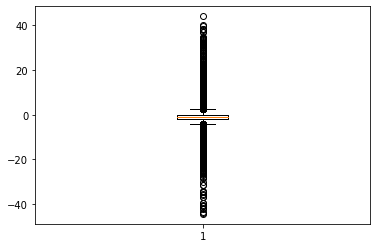

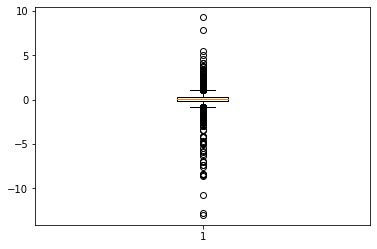

In [ ]:
data_sin_na = kur_per_class(data_sin_na, 'Y', standardize=False)

In [ ]:
data_sin_na.shape

(20666, 33)

### Retirar columnas que resulten con un solo valor

In [ ]:
v_unique_vals = data_sin_na.apply(lambda x: len(np.unique(x)) == 1)

if v_unique_vals.any():
    print('Se retiran las variables:')
    print(data_sin_na.columns[v_unique_vals])
    data_sin_na = data_sin_na.loc[:,data_sin_na.apply(lambda x: len(np.unique(x)) > 1)]
else:
    print('No hay variables a retirar con un solo valor')

No hay variables a retirar con un solo valor


## Análisis de correlaciones

In [ ]:
data4corr = data_sin_na.copy()
# Nos quedamos solo con las variables dependientes
data4corr = data4corr.drop(['Y'], axis=1)


In [ ]:
data4corr.columns

Index(['ANTIGÜEDAD', 'EDAD', 'APORTES', 'SALARIO', 'CUPO_TEORICO_ROT',
       'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD', 'PROP_RET_HIST_X_EDAD_SAL',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23', 'K_REGIONAL_27',
       'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_84', 'K_REGIONAL_99',
       'I_SEXO_F', 'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO', 'I_ESTCIV_OTRO',
       'I_ESTCIV_SEPARADO', 'I_ESTCIV_SOLTERO', 'I_ESTCIV_UNION_LIBRE'],
      dtype='object')

In [ ]:
data4corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20666 entries, 0 to 20665
Data columns (total 32 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   ANTIGÜEDAD                         20666 non-null  float64
 1   EDAD                               20666 non-null  float64
 2   APORTES                            20666 non-null  float64
 3   SALARIO                            20666 non-null  float64
 4   CUPO_TEORICO_ROT                   20666 non-null  float64
 5   TIENE_GARANTIA                     20666 non-null  float64
 6   PROP_RET_HIST_X_EDAD               20666 non-null  float64
 7   PROP_RET_HIST_X_EDAD_SAL           20666 non-null  float64
 8   SALD_ROT_ANT__CUP_ROT              20666 non-null  float64
 9   DEUDA_NO_ROT_ANT__SAL              20666 non-null  float64
 10  CUOTAS_ANT__CAP                    20666 non-null  float64
 11  MORA_EXT__DEUDA_EXT                20666 non-null  flo

In [ ]:
def corr_heatmap(data4corr, method='spearman', umbral_corr=.75):
    dfCorr = data4corr.corr(method=method)
    #Definir umbral de correlación a resaltar
    #filtrar según umbral
    filteredDf = dfCorr[((dfCorr >= umbral_corr) | (dfCorr <= -(umbral_corr))) & (dfCorr !=1.000)]
    #filteredDf = dfCorr[(abs(dfCorr) >= umbral_corr) & (dfCorr !=1.000)]
    #Retirar columnas que no tengan datos que cumplan con el umbral
    filteredDf.dropna(axis=1, how='all', inplace=True)
    # Lo mismo para las filas
    filteredDf.dropna(axis=0, how='all', inplace=True)
    plt.figure(figsize=(20,6))
    try:
        sns.heatmap(filteredDf, annot=True, cmap="Reds", linewidths=1, linecolor='black', linestyle='dashed')
    except:
        print('There are no correlations above the umbral')
    plt.show()

In [ ]:
#Definir umbral
umbral_corr = .75
method = 'spearman'

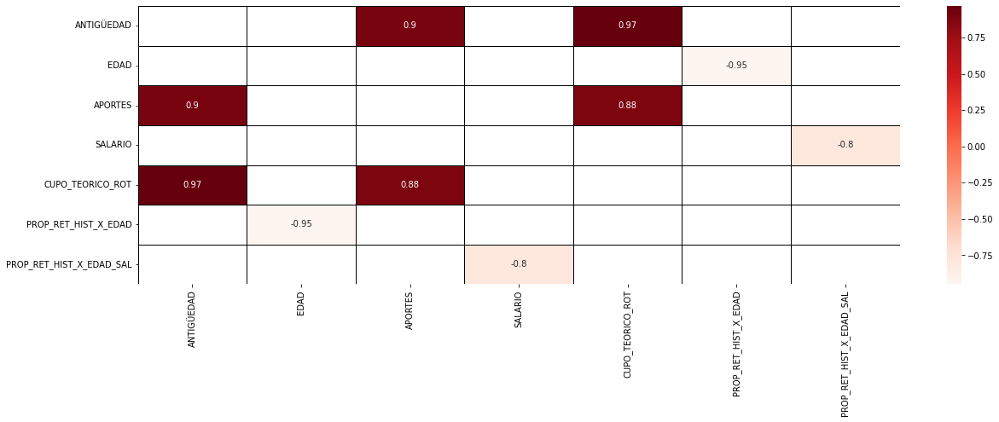

In [ ]:
corr_heatmap(data4corr, method, umbral_corr = umbral_corr)

### Examinar variables correlacionas

In [ ]:
#Gráficos
#fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(20,16))

#ax2.plot(data4corr['APORTES'], data4corr['ANTIGÜEDAD'], 'o')
#ax2.set_title("Aportes acum t-1 vs Antiguedad")

#ax3.plot(data4corr['PROP_RET_HIST_X_EDAD'], data4corr['EDAD'], 'o')
#ax3.set_title("Prop. retiro histórico por edad vs Edad")

#ax4.plot(data4corr['PROP_RET_HIST_X_EDAD_SAL'], data4corr['SALARIO'], 'o')
#ax4.set_title("Prop. retiro histórico por edad y salario vs Salario")

#ax5.plot(data4corr['CUPO_TEORICO_ROT'], data4corr['ANTIGÜEDAD'], 'o')
#ax5.set_title("Cupo teórico rotativos vs Antiguedad")

#ax6.plot(data4corr['CUOTAS_EXT__CAP'], data4corr['CUOTAS_EXT_NO_HIP__CAP'], 'o')
#ax6.set_title("Cuotas externas/Capacidad vs Cuotas externas sin hipoteca/Capacidad")

#ax7.plot(data4corr['APORTES'], data4corr['PROP_RET_HIST_X_EDAD_SAL'], 'o')
#ax7.set_title("Aportes acum t-1 vs Prop. retiro histórico por edad y salario")

#ax8.plot(data4corr['APORTES'], data4corr['CUPO_TEORICO_ROT'], 'o')
#ax8.set_title("Aportes acum t-1 vs Cupo teórico rotativos")

In [ ]:
dfCorr = data4corr['ANTIGÜEDAD','EDAD','APORTES','SALARIO','CUPO_TEORICO_ROT','TIENE_GARANTIA','PROP_RET_HIST_X_EDAD','PROP_RET_HIST_X_EDAD_SAL','SALD_ROT_ANT__CUP_ROT','DEUDA_NO_ROT_ANT__SAL','CUOTAS_ANT__CAP','MORA_EXT__DEUDA_EXT','MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP','CUOTAS_EXT__CAP','CUOTAS_EXT_NO_HIP__CAP','SALARIO__EDAD','CUPO_TEORICO_ROT__EDAD','SALARIO__ANTIGÜEDAD'].corr(method)
#Definir umbral de correlación a resaltar
#filtrar según umbral
filteredDf = dfCorr[((dfCorr >= umbral_corr) | (dfCorr <= -(umbral_corr))) & (dfCorr !=1.000)]
# Greaficas de Correlaciones entre pares de variables mas relevantes
sns.pairplot(data4corr[filteredDf.index])

KeyError: ('ANTIGÜEDAD', 'EDAD', 'APORTES', 'SALARIO', 'CUPO_TEORICO_ROT', 'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD', 'PROP_RET_HIST_X_EDAD_SAL', 'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP', 'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP', 'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD', 'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD')

### Retirar variables correlacionadas entre pares

In [ ]:
def rm_pairwise_corr_vars(dfCorr, umbral_corr):
    '''
    Esta función a partir de las correlaciones por pares que cumplan con un umbral
    establecida, retorna la variables de cada par que tengan mayor suma del valor
    absoluto de correlaciones por pares. Estas serán las que se sugiere retirar.
    En caso de que de entrada, ninguna correlación por pares cumpla con el criterio,
    se retorna una mensaje indicandolo.
    
     -----------
    Parámetros:
    dfCorr: DataFrame
        DataFrame con la correlación por pares de los datos a evaluar.
    umbral_corr: float
        Porcentaje de que debe cumplir las correlaciones por pares para evaluar 
        cual de ellas se sugiere retirar.
    -----------
    Retorna:
    vars_to_rm: list
        Lista con sugerencia de variables a remover.
    O mensaje indicando que ninguna cumplió el umbral establecido. O indicando
    alerta ante novedades.
    '''
    
    #Calcular la suma del valor absoluto de las correlaciones por pares, para cada variable
    sum_pairwise_corr = dfCorr.apply(lambda x: np.sum(np.abs(x)))
    
    #Copiar las correlaciones por pares, para proceder a filtrar las más correlacionadas
    filteredDf = dfCorr.copy()
    
    #Filtrar por los valores que cumplan el umbral
    filteredDf = filteredDf[(abs(filteredDf)>=umbral_corr) & (filteredDf!=1.000)]
    
    #Verificar que al menos un par de variables cumpla con el umbral a retirar
    if filteredDf.isna().values.all():
        return print('No hay correlaciones entre pares de variables que cumplan con el umbral a retirar.')
    
    #Crear lista donde se almancenarán las variables a retirar
    vars_to_rm = []
    
    #Iterar las correlaciones hasta no tener ninguna que cumpla el umbral a retirar
    while len(filteredDf)>0:
        #Retirar columnas que no tengan datos que cumplan con el umbral
        filteredDf.dropna(axis=1, how='all', inplace=True)
        #Lo mismo para las filas
        filteredDf.dropna(axis=0, how='all', inplace=True)
        #Obtener el par de variables más correlacionados. Dado que filteredDf es simétrica se obtendrá el par con mayor correlación.
        most_corr_pair_vars = np.max(filteredDf, axis=1).sort_values(ascending=False)[:2]
        #Validar que en efecto cuenten con el mismo valor de correlación
        if len(np.unique(most_corr_pair_vars.values))>1:
            print('El par de variables a evaluar no cumple con tener el mismo valor de correlación. Revisarlo:')
            return most_corr_pair_vars
        #Identificar la variable a remover del par más correlacionado
        var_to_rm = sum_pairwise_corr[most_corr_pair_vars.index].sort_values(ascending=False)[:1].index
        #Remover la variable de las columnas
        filteredDf.drop(var_to_rm, axis=1, inplace=True)
        #Lo mismo para las filas
        filteredDf.drop(var_to_rm, axis=0, inplace=True)
        #Almacenar variable retirada
        vars_to_rm.extend(var_to_rm)
    
    return vars_to_rm

In [ ]:
dfCorr = data4corr.corr(method='spearman')
vars_to_rm = rm_pairwise_corr_vars(dfCorr=dfCorr, umbral_corr=umbral_corr)
vars_to_rm

['ANTIGÜEDAD', 'APORTES', 'PROP_RET_HIST_X_EDAD_SAL', 'EDAD']

In [ ]:
#Retirar variables más correlacionadas
data4corr.drop(vars_to_rm, axis=1, inplace=True)

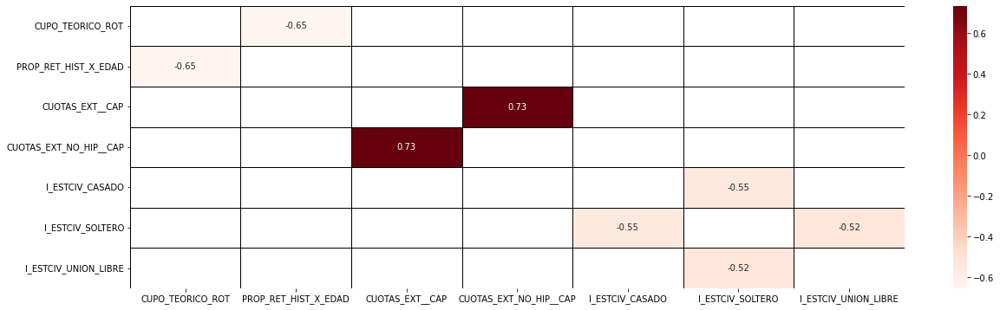

In [ ]:
#Observar correlaciones con un umbral inferior: Ya no debe tener ninguna que cumpla 
#el umbral anterior
corr_heatmap(data4corr, umbral_corr = .5)

In [ ]:
# Del anterior grafico se puede notar que es interesante como la variable PROP_RET_HIST_X_EDAD está
#   correlacionada con CUPO_TEORICO_ROT
# Con un valor de  -0.65. Lo que quiere decir que a mayor proporción de retiros históricos por edad,
#   es menor el cupo teórico rotativo
#
# Mirar si se puede concluir lo siguiente cambiando la variable de proporcion por: PROP_RET_HIST_X_ANTIGÜEDAD
## Es raro porque esta variable de proporción de retiros por edad no está correlacionada con la antigüedad


### Correlación Múltiple

Retirar variables muy explicadas por las demás

In [ ]:
def multi_corr(data4corr):
    #Diagonal de la matriz de covarianzas
    Diag_Cov = np.diag(data4corr.cov())
    #Diagonal de la matriz de precisión
    Diag_Cov_inv = np.diag(np.linalg.inv(data4corr.cov()))
    #Realizar calculo
    R2 =  1 - 1/(Diag_Cov*Diag_Cov_inv)
    #Resultados
    return pd.Series(R2, data4corr.columns).sort_values(ascending=False)

In [ ]:
multi_corr(data4corr)

I_ESTCIV_SOLTERO                     0.986689
I_ESTCIV_CASADO                      0.982421
I_ESTCIV_UNION_LIBRE                 0.981629
K_REGIONAL_84                        0.847830
K_REGIONAL_40                        0.838084
I_ESTCIV_SEPARADO                    0.804494
I_ESTCIV_OTRO                        0.795504
K_REGIONAL_49                        0.756706
K_REGIONAL_27                        0.720355
I_ESTCIV_DIVORCIADO                  0.720162
K_REGIONAL_23                        0.683519
K_REGIONAL_99                        0.592845
CUOTAS_EXT_NO_HIP__CAP               0.478555
CUOTAS_EXT__CAP                      0.477461
PROP_RET_HIST_X_EDAD                 0.451390
CUPO_TEORICO_ROT                     0.448127
CUPO_TEORICO_ROT__ANTIGÜEDAD         0.290133
SALARIO__ANTIGÜEDAD                  0.283870
SALARIO                              0.232537
CUOTAS_ANT__CAP                      0.197925
TIENE_GARANTIA                       0.146778
DEUDA_NO_ROT_ANT__SAL             

In [ ]:
#Remover variable con alta correlación múltiple
data4corr.drop('I_ESTCIV_SOLTERO', axis=1,inplace=True)

In [ ]:
multi_corr(data4corr)

K_REGIONAL_84                        0.847830
K_REGIONAL_40                        0.838080
K_REGIONAL_49                        0.756683
K_REGIONAL_27                        0.720347
K_REGIONAL_23                        0.683519
K_REGIONAL_99                        0.592807
CUOTAS_EXT_NO_HIP__CAP               0.478550
CUOTAS_EXT__CAP                      0.477460
PROP_RET_HIST_X_EDAD                 0.448566
CUPO_TEORICO_ROT                     0.447935
I_ESTCIV_CASADO                      0.316443
CUPO_TEORICO_ROT__ANTIGÜEDAD         0.290044
SALARIO__ANTIGÜEDAD                  0.283859
SALARIO                              0.232426
CUOTAS_ANT__CAP                      0.197920
I_ESTCIV_UNION_LIBRE                 0.173754
TIENE_GARANTIA                       0.146507
DEUDA_NO_ROT_ANT__SAL                0.129687
SALARIO__EDAD                        0.116348
SALD_ROT_ANT__CUP_ROT                0.103823
CUPO_TEORICO_ROT__EDAD               0.098019
I_ESTCIV_OTRO                     

In [ ]:
#Remover variable con alta correlación múltiple
data4corr.drop('K_REGIONAL_84', axis=1,inplace=True)

In [ ]:
multi_corr(data4corr)

CUOTAS_EXT_NO_HIP__CAP               0.478544
CUOTAS_EXT__CAP                      0.477459
PROP_RET_HIST_X_EDAD                 0.448036
CUPO_TEORICO_ROT                     0.447317
I_ESTCIV_CASADO                      0.316030
K_REGIONAL_40                        0.300095
CUPO_TEORICO_ROT__ANTIGÜEDAD         0.289777
SALARIO__ANTIGÜEDAD                  0.283840
SALARIO                              0.231831
CUOTAS_ANT__CAP                      0.197882
K_REGIONAL_49                        0.188725
I_ESTCIV_UNION_LIBRE                 0.173734
K_REGIONAL_27                        0.154956
TIENE_GARANTIA                       0.146438
K_REGIONAL_23                        0.138321
DEUDA_NO_ROT_ANT__SAL                0.129460
SALARIO__EDAD                        0.116296
SALD_ROT_ANT__CUP_ROT                0.103822
K_REGIONAL_99                        0.100014
CUPO_TEORICO_ROT__EDAD               0.098017
I_ESTCIV_OTRO                        0.044024
I_ESTCIV_SEPARADO                 

In [ ]:
data4corr.columns

Index(['SALARIO', 'CUPO_TEORICO_ROT', 'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23', 'K_REGIONAL_27',
       'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_99', 'I_SEXO_F',
       'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO', 'I_ESTCIV_OTRO',
       'I_ESTCIV_SEPARADO', 'I_ESTCIV_UNION_LIBRE'],
      dtype='object')

In [ ]:
cols_no_corr = data4corr.columns.to_list() + ['Y']

In [ ]:
#Conservar las variables no altamente correlacionadas
data_sin_na = data_sin_na[cols_no_corr].copy()

In [ ]:
#Exportar datos
data_sin_na.to_excel('data_sin_na.xlsx', index=False)

In [ ]:
# data_sin_na = pd.read_excel('data_sin_na.xlsx', sheet_name='Sheet1')

# Análisis de variables relevantes

## Estadísticos y gráficos de X con respecto a categorías de Y

Gráficos:

#### Boxplot

In [ ]:
# Mover 'Y' al final
new_cols = [col for col in data_sin_na.columns if col != 'Y' and col != 'TIENE_GARANTIA'] + ['TIENE_GARANTIA'] + ['Y']
temp = data_sin_na[new_cols]
temp

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA,Y
0,-0.396945,-0.792429,0.591078,-2.462762,1.955541,6.737092,0.125020,0.112028,1.043074,0.528886,...,0,0,0,0,0,0,0,0,0,0
1,-0.063363,-0.096683,0.591078,-126.451865,-12.821440,12.426385,0.126823,0.115211,6.534429,3.313253,...,0,0,1,0,0,0,0,0,1,0
2,-0.263944,-0.792429,0.095655,-3.703740,2.940932,8.996162,-2.416796,1.668323,-5.159883,-5.933169,...,0,1,0,1,0,0,0,0,0,0
3,-0.474884,-0.792429,0.591078,0.274826,1.634593,2.761593,0.102301,0.064110,0.672071,0.242272,...,0,0,1,0,0,0,0,0,0,0
4,-0.468844,-0.792429,0.591078,-1.343999,0.795488,3.804463,0.125020,0.112028,0.883116,0.447780,...,0,1,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20661,-0.325521,-0.444556,0.095655,-5.353132,2.384616,-4.251628,0.140488,0.142528,1.271941,0.644932,...,0,0,0,0,0,0,0,1,0,1
20662,-0.421009,-0.792429,0.095655,-2.258255,-0.520811,2.422155,0.186520,0.311948,0.765173,0.280374,...,0,0,0,0,0,0,0,0,0,1
20663,-0.371466,-0.792429,0.260536,3.521519,0.534404,-0.502645,0.080094,0.014751,1.114619,0.565163,...,0,0,0,0,0,0,0,1,0,1
20664,-0.451660,-0.792429,0.260536,0.330446,1.199614,2.688329,0.010523,-0.161201,0.425411,-0.026488,...,0,1,0,0,0,0,0,1,0,1


In [ ]:
mask = ~temp.isin([0,1])
temp[mask.reindex(temp.index, fill_value = False)]

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA,Y
0,-0.396945,-0.792429,0.591078,-2.462762,1.955541,6.737092,0.125020,0.112028,1.043074,0.528886,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.063363,-0.096683,0.591078,-126.451865,-12.821440,12.426385,0.126823,0.115211,6.534429,3.313253,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.263944,-0.792429,0.095655,-3.703740,2.940932,8.996162,-2.416796,1.668323,-5.159883,-5.933169,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.474884,-0.792429,0.591078,0.274826,1.634593,2.761593,0.102301,0.064110,0.672071,0.242272,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.468844,-0.792429,0.591078,-1.343999,0.795488,3.804463,0.125020,0.112028,0.883116,0.447780,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20661,-0.325521,-0.444556,0.095655,-5.353132,2.384616,-4.251628,0.140488,0.142528,1.271941,0.644932,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20662,-0.421009,-0.792429,0.095655,-2.258255,-0.520811,2.422155,0.186520,0.311948,0.765173,0.280374,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20663,-0.371466,-0.792429,0.260536,3.521519,0.534404,-0.502645,0.080094,0.014751,1.114619,0.565163,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20664,-0.451660,-0.792429,0.260536,0.330446,1.199614,2.688329,0.010523,-0.161201,0.425411,-0.026488,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
sum(~temp.isin([0,1]).any())


14

In [ ]:
# temp.to_excel('temp.xlsx')

In [ ]:
temp

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA,Y
0,-0.396945,-0.792429,0.591078,-2.462762,1.955541,6.737092,0.125020,0.112028,1.043074,0.528886,...,0,0,0,0,0,0,0,0,0,0
1,-0.063363,-0.096683,0.591078,-126.451865,-12.821440,12.426385,0.126823,0.115211,6.534429,3.313253,...,0,0,1,0,0,0,0,0,1,0
2,-0.263944,-0.792429,0.095655,-3.703740,2.940932,8.996162,-2.416796,1.668323,-5.159883,-5.933169,...,0,1,0,1,0,0,0,0,0,0
3,-0.474884,-0.792429,0.591078,0.274826,1.634593,2.761593,0.102301,0.064110,0.672071,0.242272,...,0,0,1,0,0,0,0,0,0,0
4,-0.468844,-0.792429,0.591078,-1.343999,0.795488,3.804463,0.125020,0.112028,0.883116,0.447780,...,0,1,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20661,-0.325521,-0.444556,0.095655,-5.353132,2.384616,-4.251628,0.140488,0.142528,1.271941,0.644932,...,0,0,0,0,0,0,0,1,0,1
20662,-0.421009,-0.792429,0.095655,-2.258255,-0.520811,2.422155,0.186520,0.311948,0.765173,0.280374,...,0,0,0,0,0,0,0,0,0,1
20663,-0.371466,-0.792429,0.260536,3.521519,0.534404,-0.502645,0.080094,0.014751,1.114619,0.565163,...,0,0,0,0,0,0,0,1,0,1
20664,-0.451660,-0.792429,0.260536,0.330446,1.199614,2.688329,0.010523,-0.161201,0.425411,-0.026488,...,0,1,0,0,0,0,0,1,0,1


In [ ]:
_deepnote_run_altair(temp, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"bar","tooltip":true},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}},"y":{"field":"","type":"nominal","sort":null,"scale":{"type":"linear","zero":true}},"color":{"field":"","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

In [ ]:
fig, axs = plt.subplots(9,2,figsize=(30,15),dpi=800)
fig.subplots_adjust(hspace=1)
fig.suptitle('Diagramas de caja y bigotes de las variables por categoria', fontsize=15)
i=0
k=0
l=18
m = 0

for j in range(0,l):
    sns.boxplot(x='Y', y=temp.iloc[:,j], data=temp, ax=axs[k][i+j]).set(xlabel=None, title=temp.columns[j], ylabel=None)
    if j == m+1:
        k = k+1
        i = -j-1
        m = m+2

Error in callback <function flush_figures at 0x7fbddf75bc20> (for post_execute):


KeyboardInterrupt: 

Media:

In [ ]:
mean = temp.groupby('Y').mean()
mean

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA
Y,,,,,,,,,,,,,,,,,,,,,
0,0.027156,0.028911,0.323552,-0.040492,1.054406,1.697012,0.100631,0.077558,0.496600,0.068414,...,0.267112,0.132805,0.058144,0.520555,0.262556,0.009371,0.013928,0.014704,0.230092,0.117428
1,-0.385091,-0.586330,0.453962,2.136015,1.189994,1.080576,0.112689,0.069296,0.306592,-0.113553,...,0.139793,0.199704,0.065089,0.369083,0.116864,0.000000,0.005178,0.005917,0.309911,0.011095


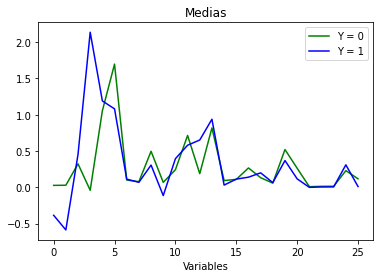

In [ ]:
column_headers = list(mean.columns.values)
cols_index = [mean.columns.get_loc(col) for col in column_headers]
fila1 = list(mean.iloc[0])
fila2 = list(mean.iloc[1])
plt.plot(cols_index, fila1, label = "Y = 0", color='green')
plt.plot(cols_index, fila2, label = "Y = 1", color='blue')
plt.xlabel('Variables')
plt.title('Medias')
plt.legend()

Mediana

In [ ]:
median = temp.groupby('Y').median()
median

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA
Y,,,,,,,,,,,,,,,,,,,,,
0,-0.318870,-0.444556,0.260536,-0.066265,1.450812,2.234866,0.12502,0.112028,0.883116,0.384297,...,0,0,0,1,0,0,0,0,0,0
1,-0.421009,-0.792429,0.591078,0.730625,1.425116,1.621221,0.12502,0.099639,0.805834,0.350830,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
median = median[indexes]

Text(0.5, 1.0, 'Medianas')

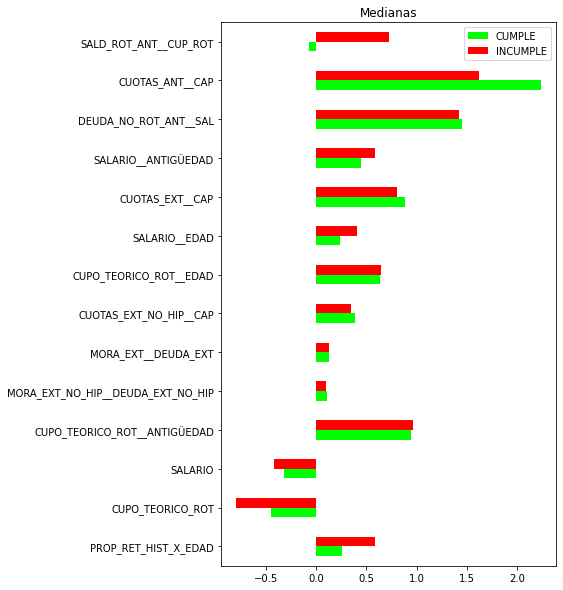

In [ ]:
median.T.plot.barh(figsize=(6,10), color={1: "red", 0: "lime"})
plt.legend(["CUMPLE", "INCUMPLE"])
plt.title("Medianas")

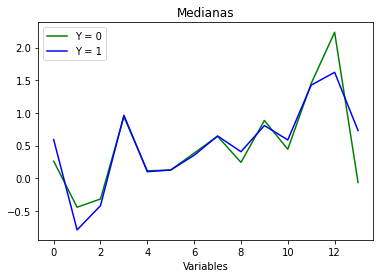

In [ ]:
column_headers = list(median.columns.values)
cols_index = [median.columns.get_loc(col) for col in column_headers]
fila1 = list(median.iloc[0])
fila2 = list(median.iloc[1])
plt.plot(cols_index, fila1, label = "Y = 0", color='green')
plt.plot(cols_index, fila2, label = "Y = 1", color='blue')
plt.xlabel('Variables')
plt.title('Medianas')
plt.legend()

Moda

In [ ]:
mode = temp.groupby('Y').agg(pd.Series.mode)
mode

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA
Y,,,,,,,,,,,,,,,,,,,,,
0,-0.350742,-0.792429,0.591078,-22.04861,2.136069,7.359033,0.12502,0.112028,1.139367,0.577711,...,0,0,0,1,0,0,0,0,0,0
1,-0.421009,-0.792429,0.591078,"[-4.34746082566569, -4.139002702560247, -2.631...",1.718645,"[5.372074550911323, 6.865501234964967]",0.12502,0.112028,0.916716,0.464817,...,0,0,0,0,0,0,0,0,0,0


Desviación estandar:

In [ ]:
desviaciones = temp.groupby('Y').std()
desviaciones

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA
Y,,,,,,,,,,,,,,,,,,,,,
0,1.047327,1.008034,0.212986,25.652250,5.613700,12.219845,1.770454,1.537928,4.583299,2.942108,...,0.442463,0.339373,0.234022,0.499590,0.440034,0.096354,0.117194,0.120370,0.420903,0.321938
1,0.272214,0.380281,0.185187,11.432371,1.370039,4.802062,1.057213,1.591812,2.260894,2.013396,...,0.346900,0.399926,0.246774,0.482735,0.321377,0.000000,0.071795,0.076724,0.462628,0.104784


In [ ]:
desviaciones = desviaciones[desviaciones.columns[range(14)]]
desviaciones

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,SALARIO__EDAD,CUPO_TEORICO_ROT__EDAD,SALARIO__ANTIGÜEDAD,CUPO_TEORICO_ROT__ANTIGÜEDAD
Y,,,,,,,,,,,,,,
0,1.047327,1.008034,0.212986,25.652250,5.613700,12.219845,1.770454,1.537928,4.583299,2.942108,4.099468,3.834013,5.380601,1.478045
1,0.272214,0.380281,0.185187,11.432371,1.370039,4.802062,1.057213,1.591812,2.260894,2.013396,1.742823,2.812679,1.640017,0.506831


In [ ]:
df = desviaciones.iloc[:,(-desviaciones.loc[0].abs()).argsort()[::-1]]
df

,PROP_RET_HIST_X_EDAD,CUPO_TEORICO_ROT,SALARIO,CUPO_TEORICO_ROT__ANTIGÜEDAD,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,MORA_EXT__DEUDA_EXT,CUOTAS_EXT_NO_HIP__CAP,CUPO_TEORICO_ROT__EDAD,SALARIO__EDAD,CUOTAS_EXT__CAP,SALARIO__ANTIGÜEDAD,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,SALD_ROT_ANT__CUP_ROT
Y,,,,,,,,,,,,,,
0,0.212986,1.008034,1.047327,1.478045,1.537928,1.770454,2.942108,3.834013,4.099468,4.583299,5.380601,5.613700,12.219845,25.652250
1,0.185187,0.380281,0.272214,0.506831,1.591812,1.057213,2.013396,2.812679,1.742823,2.260894,1.640017,1.370039,4.802062,11.432371


In [ ]:
df = df.T
df

Y,0,1
PROP_RET_HIST_X_EDAD,0.212986,0.185187
CUPO_TEORICO_ROT,1.008034,0.380281
SALARIO,1.047327,0.272214
CUPO_TEORICO_ROT__ANTIGÜEDAD,1.478045,0.506831
MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,1.537928,1.591812
MORA_EXT__DEUDA_EXT,1.770454,1.057213
CUOTAS_EXT_NO_HIP__CAP,2.942108,2.013396
CUPO_TEORICO_ROT__EDAD,3.834013,2.812679
SALARIO__EDAD,4.099468,1.742823
CUOTAS_EXT__CAP,4.583299,2.260894


In [ ]:
df = desviaciones.T.sort_values(0)

In [ ]:
indexes = df.T.columns
#median[indexes]

Text(0.5, 1.0, 'Desviaciones Estándar')

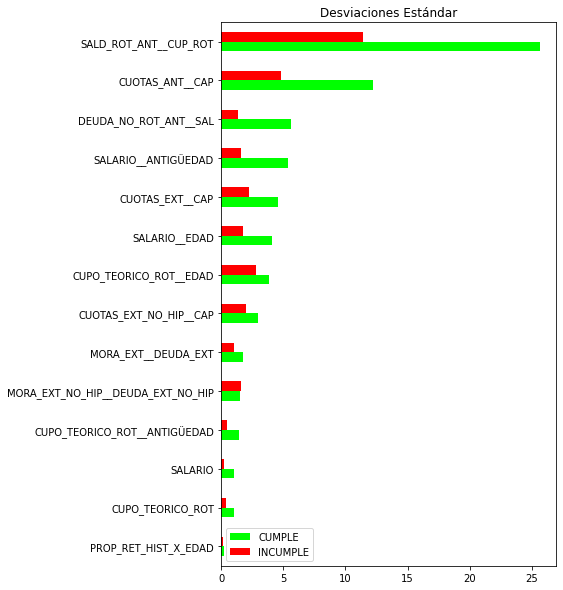

In [ ]:
df.plot.barh(figsize=(6,10), color={1: "red", 0: "lime"})
plt.legend(["CUMPLE", "INCUMPLE"])
plt.title("Desviaciones Estándar")


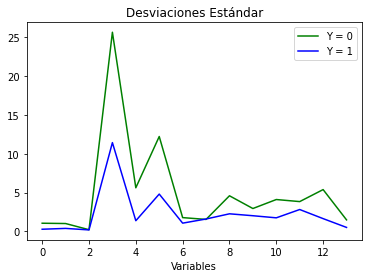

In [ ]:
column_headers = list(desviaciones.columns.values)
cols_index = [desviaciones.columns.get_loc(col) for col in column_headers]
fila1 = list(desviaciones.iloc[0])
fila2 = list(desviaciones.iloc[1])
plt.plot(cols_index, fila1, label = "Y = 0", color='green')
plt.plot(cols_index, fila2, label = "Y = 1", color='blue')
plt.xlabel('Variables')
plt.title('Desviaciones Estándar')
plt.legend()

Asimetría:

In [ ]:
asimetria = temp.groupby('Y').skew()
asimetria

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA
Y,,,,,,,,,,,,,,,,,,,,,
0,4.598006,1.441824,0.218135,0.406885,-0.735196,-0.895676,-3.166518,2.126489,-1.593567,-3.137087,...,1.052799,2.164185,3.776576,-0.082296,1.079320,10.184928,8.296027,8.064246,1.282652,2.376931
1,18.983109,4.876986,-0.754494,1.939222,-0.576611,-1.309490,3.397348,-1.993546,-4.115436,-5.410388,...,2.079795,1.503982,3.530000,0.543201,2.387873,0.000000,13.804739,12.898645,0.822996,9.345496


In [ ]:
asimetria = asimetria[asimetria.columns[range(14)]]

In [ ]:
asimetria = asimetria.T.sort_values(1, ascending=True).T

In [ ]:
indexes = asimetria.columns
kurtosis[indexes]

,CUOTAS_EXT_NO_HIP__CAP,CUOTAS_EXT__CAP,CUPO_TEORICO_ROT__ANTIGÜEDAD,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_ANT__CAP,CUPO_TEORICO_ROT__EDAD,PROP_RET_HIST_X_EDAD,DEUDA_NO_ROT_ANT__SAL,SALARIO__ANTIGÜEDAD,SALARIO__EDAD,SALD_ROT_ANT__CUP_ROT,MORA_EXT__DEUDA_EXT,CUPO_TEORICO_ROT,SALARIO
Y,,,,,,,,,,,,,,
0,81.882312,43.964911,126.063198,247.741783,29.731842,59.032827,-1.530112,43.471506,47.407989,51.516834,32.332263,242.206167,1.021250,25.275710
1,45.857722,31.380285,53.353419,73.476117,18.386988,40.641460,-1.099583,18.657848,49.028141,31.251588,20.360306,90.270458,34.814381,478.621983


Text(0.5, 1.0, 'Asimetrias')

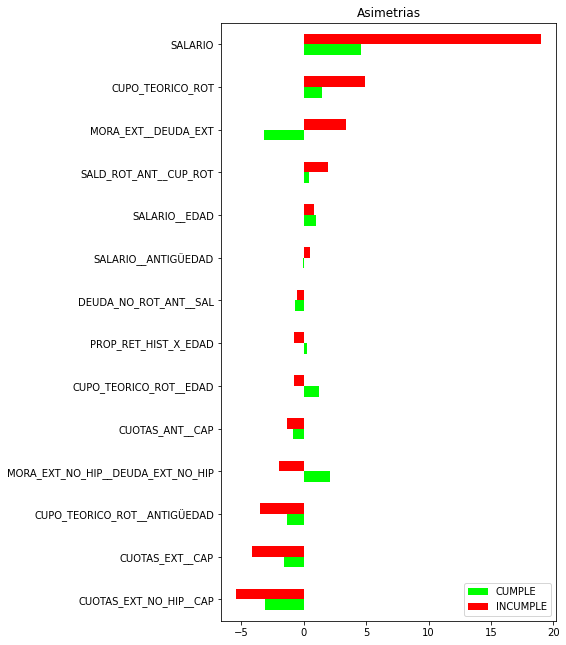

In [ ]:
asimetria.T.plot.barh(figsize=(6,11), color={1: "red", 0: "lime"})
plt.legend(["CUMPLE", "INCUMPLE"])
plt.title("Asimetrias")

In [ ]:
asimetria

,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,SALARIO,K_REGIONAL_99,K_REGIONAL_23,K_REGIONAL_27,TIENE_GARANTIA,K_REGIONAL_49,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,...,SALD_ROT_ANT__CUP_ROT,PROP_RET_HIST_X_EDAD,SALARIO__ANTIGÜEDAD,I_SEXO_F,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,CUPO_TEORICO_ROT__ANTIGÜEDAD,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,MORA_EXT__DEUDA_EXT
Y,,,,,,,,,,,,,,,,,,,,,
0,10.184928,8.296027,8.064246,4.598006,3.776576,2.796821,2.496080,2.376931,2.164185,2.126489,...,0.406885,0.218135,-0.028477,-0.082296,-0.735196,-0.895676,-1.332474,-1.593567,-3.137087,-3.166518
1,0.000000,13.804739,12.898645,18.983109,3.530000,5.411793,2.444886,9.345496,1.503982,-1.993546,...,1.939222,-0.754494,0.521067,0.543201,-0.576611,-1.309490,-3.487084,-4.115436,-5.410388,3.397348


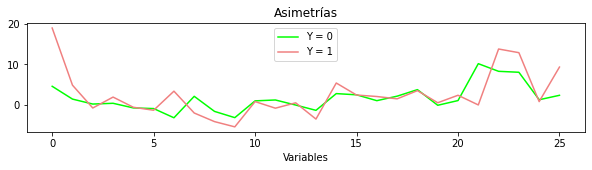

In [ ]:
column_headers = list(asimetria.columns.values)
cols_index = [asimetria.columns.get_loc(col) for col in column_headers]
fila1 = list(asimetria.iloc[0])
fila2 = list(asimetria.iloc[1])
plt.figure(figsize=(10, 2))
plt.plot(cols_index, fila1, label = "Y = 0", color='lime')
plt.plot(cols_index, fila2, label = "Y = 1", color='lightcoral')
plt.xlabel('Variables')
plt.title('Asimetrías')
plt.legend()

In [ ]:
asimetria = asimetria[asimetria.columns[range(18)]]
asimetria

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,SALARIO__EDAD,CUPO_TEORICO_ROT__EDAD,SALARIO__ANTIGÜEDAD,CUPO_TEORICO_ROT__ANTIGÜEDAD,K_REGIONAL_23,K_REGIONAL_27,K_REGIONAL_40,K_REGIONAL_49
Y,,,,,,,,,,,,,,,,,,
0,4.598006,1.441824,0.218135,0.406885,-0.735196,-0.895676,-3.166518,2.126489,-1.593567,-3.137087,1.005244,1.223617,-0.028477,-1.332474,2.796821,2.496080,1.052799,2.164185
1,18.983109,4.876986,-0.754494,1.939222,-0.576611,-1.309490,3.397348,-1.993546,-4.115436,-5.410388,0.824653,-0.801605,0.521067,-3.487084,5.411793,2.444886,2.079795,1.503982


In [ ]:
asimetria = asimetria[asimetria.columns[range(14)]]
asimetria

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,SALARIO__EDAD,CUPO_TEORICO_ROT__EDAD,SALARIO__ANTIGÜEDAD,CUPO_TEORICO_ROT__ANTIGÜEDAD
Y,,,,,,,,,,,,,,
0,4.598006,1.441824,0.218135,0.406885,-0.735196,-0.895676,-3.166518,2.126489,-1.593567,-3.137087,1.005244,1.223617,-0.028477,-1.332474
1,18.983109,4.876986,-0.754494,1.939222,-0.576611,-1.309490,3.397348,-1.993546,-4.115436,-5.410388,0.824653,-0.801605,0.521067,-3.487084


In [ ]:
asimetria = asimetria.sort_values(0, ascending=False)

In [ ]:
asimetria

Y,0,1
SALARIO,4.598006,18.983109
MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,2.126489,-1.993546
CUPO_TEORICO_ROT,1.441824,4.876986
CUPO_TEORICO_ROT__EDAD,1.223617,-0.801605
SALARIO__EDAD,1.005244,0.824653
SALD_ROT_ANT__CUP_ROT,0.406885,1.939222
PROP_RET_HIST_X_EDAD,0.218135,-0.754494
SALARIO__ANTIGÜEDAD,-0.028477,0.521067
DEUDA_NO_ROT_ANT__SAL,-0.735196,-0.576611
CUOTAS_ANT__CAP,-0.895676,-1.309490


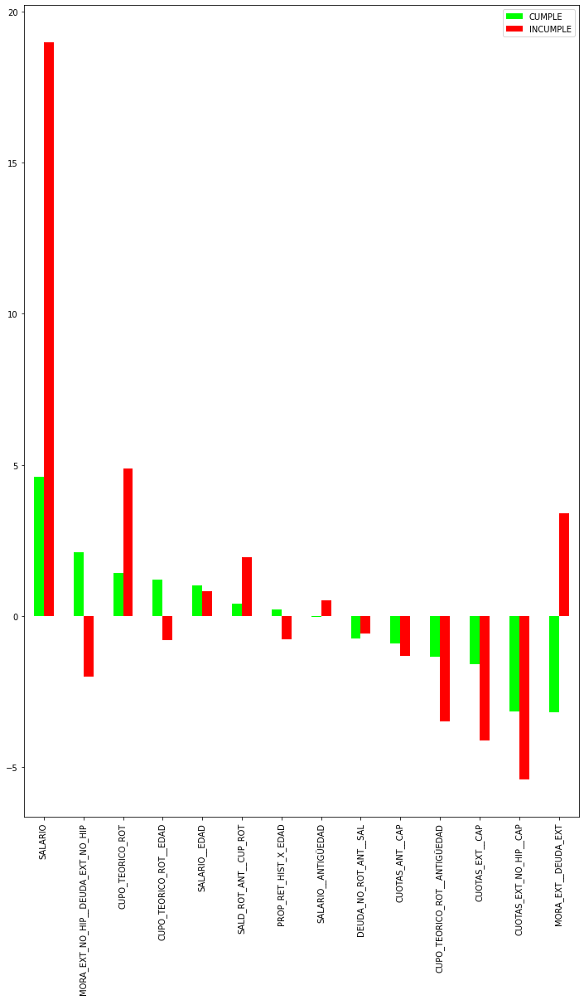

In [ ]:
asimetria.plot.bar(figsize=(12,18), color={1: "red", 0: "lime"})
plt.legend(["CUMPLE", "INCUMPLE"])

In [ ]:
df = asimetria.iloc[:,(asimetria.loc[0].abs()).argsort()]
df

,SALARIO__ANTIGÜEDAD,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,SALARIO__EDAD,CUPO_TEORICO_ROT__EDAD,CUPO_TEORICO_ROT__ANTIGÜEDAD,CUPO_TEORICO_ROT,CUOTAS_EXT__CAP,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT_NO_HIP__CAP,MORA_EXT__DEUDA_EXT,SALARIO
Y,,,,,,,,,,,,,,
0,-0.028477,0.218135,0.406885,-0.735196,-0.895676,1.005244,1.223617,-1.332474,1.441824,-1.593567,2.126489,-3.137087,-3.166518,4.598006
1,0.521067,-0.754494,1.939222,-0.576611,-1.309490,0.824653,-0.801605,-3.487084,4.876986,-4.115436,-1.993546,-5.410388,3.397348,18.983109


In [ ]:
df = asimetria.iloc[:,(-asimetria.loc[0].abs()).argsort()[::-1]]
df = df.T
df.plot.barh(figsize=(12,18), color={1: "red", 0: "green"})
plt.legend(["CUMPLE", "INCUMPLE"])

Kurtosis

In [ ]:
kurtosis = temp.groupby('Y').apply(pd.DataFrame.kurt)
kurtosis

,SALARIO,CUPO_TEORICO_ROT,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,...,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE,TIENE_GARANTIA,Y
Y,,,,,,,,,,,,,,,,,,,,,
0,25.275710,1.021250,-1.530112,32.332263,43.471506,29.731842,242.206167,247.741783,43.964911,81.882312,...,2.683973,12.263794,-1.993434,-0.835155,101.74329,66.830992,63.038595,-0.35484,3.650180,0.0
1,478.621983,34.814381,-1.099583,20.360306,18.657848,18.386988,90.270458,73.476117,31.380285,45.857722,...,0.262349,10.476395,-1.707460,3.707422,0.00000,188.850184,164.618553,-1.32464,85.464728,0.0


In [ ]:
kurtosis = kurtosis[indexes]

In [ ]:
kurtosis

,CUOTAS_EXT_NO_HIP__CAP,CUOTAS_EXT__CAP,CUPO_TEORICO_ROT__ANTIGÜEDAD,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_ANT__CAP,CUPO_TEORICO_ROT__EDAD,PROP_RET_HIST_X_EDAD,DEUDA_NO_ROT_ANT__SAL,SALARIO__ANTIGÜEDAD,SALARIO__EDAD,SALD_ROT_ANT__CUP_ROT,MORA_EXT__DEUDA_EXT,CUPO_TEORICO_ROT,SALARIO
Y,,,,,,,,,,,,,,
0,81.882312,43.964911,126.063198,247.741783,29.731842,59.032827,-1.530112,43.471506,47.407989,51.516834,32.332263,242.206167,1.021250,25.275710
1,45.857722,31.380285,53.353419,73.476117,18.386988,40.641460,-1.099583,18.657848,49.028141,31.251588,20.360306,90.270458,34.814381,478.621983


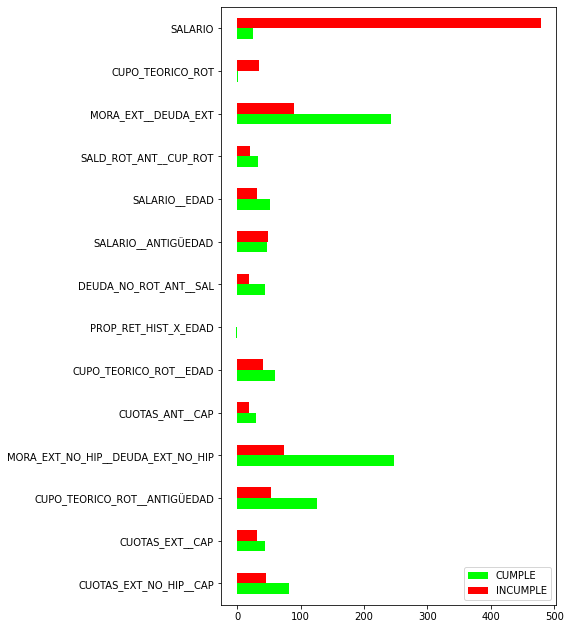

In [ ]:
kurtosis.T.plot.barh(figsize=(6,11), color={1: "red", 0: "lime"})
plt.legend(["CUMPLE", "INCUMPLE"])

In [ ]:
kurtosis

,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,SALARIO,K_REGIONAL_99,K_REGIONAL_23,K_REGIONAL_27,TIENE_GARANTIA,K_REGIONAL_49,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,...,SALD_ROT_ANT__CUP_ROT,PROP_RET_HIST_X_EDAD,SALARIO__ANTIGÜEDAD,I_SEXO_F,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,CUPO_TEORICO_ROT__ANTIGÜEDAD,CUOTAS_EXT__CAP,CUOTAS_EXT_NO_HIP__CAP,MORA_EXT__DEUDA_EXT
Y,,,,,,,,,,,,,,,,,,,,,
0,101.74329,66.830992,63.038595,25.275710,12.263794,5.822810,4.230852,3.650180,2.683973,247.741783,...,32.332263,-1.530112,47.407989,-1.993434,43.471506,29.731842,126.063198,43.964911,81.882312,242.206167
1,0.00000,188.850184,164.618553,478.621983,10.476395,27.327932,3.983358,85.464728,0.262349,73.476117,...,20.360306,-1.099583,49.028141,-1.707460,18.657848,18.386988,53.353419,31.380285,45.857722,90.270458


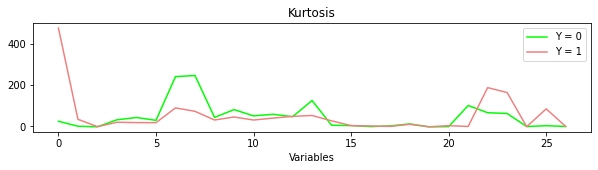

In [ ]:
column_headers = list(kurtosis.columns.values)
cols_index = [kurtosis.columns.get_loc(col) for col in column_headers]
fila1 = list(kurtosis.iloc[0])
fila2 = list(kurtosis.iloc[1])
plt.figure(figsize=(10, 2))
plt.plot(cols_index, fila1, label = "Y = 0", color='lime')
plt.plot(cols_index, fila2, label = "Y = 1", color='lightcoral')
plt.xlabel('Variables')
plt.title('Kurtosis')
plt.legend()

In [ ]:
hist()

Desviación estandar generalizada:

In [ ]:
desviacion_generalizada = temp.groupby('Y').apply(lambda x: np.sqrt(np.linalg.det(x.drop('Y',axis=1).cov())))
desviacion_generalizada

Y
0    0.051805
1    0.000000
dtype: float64

# Análisis de desbalanceo de clases

In [ ]:
data_sin_na['Y'].value_counts()

0    19314
1     1352
Name: Y, dtype: int64

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

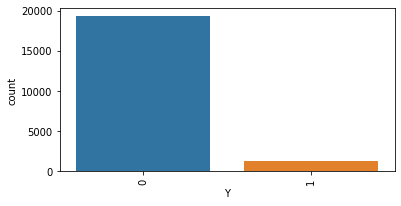

In [ ]:
plt.figure(figsize=(6,3))
sns.countplot(data_sin_na['Y'])
plt.xticks(rotation=90)

## Oversampling con cholesky

In [ ]:
data2balance = data_sin_na.copy()
# data2balance

In [ ]:
#Simular datos usando cholesky
def simulate_data(df, n_simul):
    '''Esta función simula datos multivariantes utlizando la
    transformación de cholesky

    -----------
    Parámetros:
    df: DataFrame
        DataFrame con datos originales que serán la base para realizar simulación
    n_simul: int
        Cantidad de registros a simular
    -----------
    Retorna:
    df_datos2: DataFrame
        DataFrame con datos simulados y con media de los originales
    '''

    #Dimensiones
    row,col=df.shape
    #Datos como arreglo
    x=df.to_numpy()
    #Vector de unos
    unos=np.ones((row,1))
    #vector de medias
    x_barra=(1/row)*(x.T@unos)
    #Matriz de centrado
    x_centrado=x-unos@x_barra.T
    #cov
    sigma=(1/(row-1))*(x_centrado.T@x_centrado)
    try:
        print('Probando la matriz de covarianza usual \n')
        L=np.linalg.cholesky(sigma) #cholesky
        print('Éxito con la matriz de covarianza usual')
        print('Determinante de la matriz de covarianza usual:', np.linalg.det(sigma))
        print('Número de condición de matriz de covarianza usual:', np.linalg.cond(sigma), '\n')
    except:
        print('Advertencia utilizando la matriz de covarianza usual')
        print('Determinante de la matriz de covarianza usual:', np.linalg.det(sigma))
        print('Número de condición de matriz de covarianza usual:', np.linalg.cond(sigma), '\n')
        print('Probar la estimación de la matriz de covarianza con Shrinkage \n')
        eig,vect=np.linalg.eig(sigma)
        i=0
        if abs(min(eig)) == 0:
            impulso = .0001
        else:
            impulso = abs(min(eig))

        while np.linalg.det(sigma)<15:
            sigma=sigma+np.eye(col)*(i*impulso)
            i+=1
            if i==50:
                break
        #from sklearn.covariance import LedoitWolf
        #sigma=LedoitWolf().fit(x_centrado).covariance_
        L=np.linalg.cholesky(sigma) #cholesky
        print('Éxito con la matriz de covarianza con Shrinkage')

        print('Incrementando: '+str(i)+
              ' veces un impulso pequeño, resultando en un incremento de : '+
              str(i*impulso)+'\n')
        print('Determinante de la matriz de covarianza con Shrinkage:', np.linalg.det(sigma))
        print('Número de condición de la matriz de covarianza con Shrinkage:', np.linalg.cond(sigma), '\n')
    #Datos ruido blanco
    Ruido=np.random.randn(col,n_simul)
    aux=L@Ruido
    #datos simulados, pero no tienen la media de originales
    datos=aux.T
    df_datos=pd.DataFrame(datos, columns=df.columns)
    
    #Dimensiones
    row_simul,col_simul=df_datos.shape
    #Datos como arreglo
    x_simul = df_datos.to_numpy()
    #Vector de unos
    unos_simul = np.ones((row_simul,1))
    x_barra_simul = (1/row_simul)*(x_simul.T@unos_simul)
    
    #Matriz de centrado simulada
    x_centrado_simul = x_simul - unos_simul@x_barra_simul.T
    #Agregar la media de los originales
    datos2 = x_centrado_simul + unos_simul@x_barra.T
    df_datos2=pd.DataFrame(datos2, columns=df.columns)
    
    return df_datos2


#Balancear datos por clase
def balance_data(datos, col_cat, n):
    '''Esta función implementa por categoría la función
    simulate_data: La cual simula datos multivariantes utlizando la
    transformación de cholesky

    -----------
    Parámetros:
    datos: DataFrame
        DataFrame con datos originales que serán la base para realizar simulación
    col_cat: string
        Nombre de la columna de las categorías de los datos
    n: int
        Cantidad de registros a deseados por categoría
    -----------
    Retorna:
    data: DataFrame
        DataFrame con datos simulados y con media de los originales
        por categoría
    '''

    data=datos.copy()
    for i in np.unique(data[col_cat]):
        df=data.loc[data[col_cat]==i].drop(col_cat, axis=1).copy()
        if len(df)>n:
            print('n no puede ser menor que la longitud de alguna categoría')
            break
        if len(df)==n:
            pass
        else:
            n_simul=n-len(df)
            df_simul=simulate_data(df, n_simul)
            df_simul[col_cat]=i
            data=data.append(df_simul, ignore_index=True)
    return data

In [ ]:
# Datos por categoría
data2balance.Y.value_counts()

0    19314
1     1352
Name: Y, dtype: int64

In [ ]:
#mayor longitud en las clases
max_class_len=np.max(data2balance.Y.value_counts())
print(max_class_len)

19314


In [ ]:
data2balance.columns

Index(['SALARIO', 'CUPO_TEORICO_ROT', 'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23', 'K_REGIONAL_27',
       'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_99', 'I_SEXO_F',
       'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO', 'I_ESTCIV_OTRO',
       'I_ESTCIV_SEPARADO', 'I_ESTCIV_UNION_LIBRE', 'Y'],
      dtype='object')

In [ ]:
#Balancear categorías con menos datos
balanced_data_chol = balance_data(data2balance, 'Y', max_class_len)

Probando la matriz de covarianza usual 

Advertencia utilizando la matriz de covarianza usual
Determinante de la matriz de covarianza usual: 0.0
Número de condición de matriz de covarianza usual: 2.8265031968747805e+20 

Probar la estimación de la matriz de covarianza con Shrinkage 

Éxito con la matriz de covarianza con Shrinkage
Incrementando: 50 veces un impulso pequeño, resultando en un incremento de : 0.005

Determinante de la matriz de covarianza con Shrinkage: 7.2083107841837674e-06
Número de condición de la matriz de covarianza con Shrinkage: 1140.0110575761398 



In [ ]:
balanced_data_chol.columns.str.contains('PROP')

array([False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False])

In [ ]:
# Las variables discretas deben conservar su naturaleza en los datos simulados:

# Variables que contienen binarias
cols_dummies = balanced_data_chol.columns.str.contains('K_REGIONAL|I_SEXO|I_ESTCIV|TIENE_GARANTIA')
data_cols_dummies = balanced_data_chol.columns[cols_dummies]

for col in data_cols_dummies:
    balanced_data_chol[col] = np.where(balanced_data_chol[col] <= .5, 0, 1)

In [ ]:
balanced_data_chol.drop(balanced_data_chol.columns[cols_dummies], axis=1).columns

Index(['SALARIO', 'CUPO_TEORICO_ROT', 'PROP_RET_HIST_X_EDAD',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'Y'],
      dtype='object')

In [ ]:
for col in balanced_data_chol.drop(balanced_data_chol.columns[cols_dummies], axis=1).columns:
    print('-----------')
    print(col)
    # print([(val) for val in balanced_data_chol[col].value_counts()])
    # print(balanced_data_chol[col].value_counts().index[:10])
    print(balanced_data_chol[col].value_counts().values[:30])

-----------
SALARIO
[1474 1350 1141  891  669  548  480  476  237  228  228  222  218  217
  204  187  185  176  168  166  160  159  155  151  148  122  121  114
  110  107]
-----------
CUPO_TEORICO_ROT
[15158  9472  9418  3175  1405]
-----------
PROP_RET_HIST_X_EDAD
[7755 6965 4194 1571  158   19    4    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1]
-----------
SALD_ROT_ANT__CUP_ROT
[125 106  62  56  52  52  52  51  48  45  44  42  42  35  35  31  31  29
  27  27  26  25  24  24  23  22  22  21  21  21]
-----------
DEUDA_NO_ROT_ANT__SAL
[480 390 390 356 230 203 146 104  91  86  80  79  69  65  64  56  54  51
  50  49  48  44  44  43  42  40  37  36  36  35]
-----------
CUOTAS_ANT__CAP
[30 23 15 14 13 13 12 10 10 10  9  8  8  7  7  6  6  6  6  6  6  5  5  5
  5  5  5  4  4  4]
-----------
MORA_EXT__DEUDA_EXT
[3798   25   22   20   18   18   17   15   15   14   13   13   13   13
   13   12   12   12   12   12   12   11

In [ ]:
# Del anterior analisis observamos que solo es necesario procesar la columna CUPO_TEORICO_ROT para que sus valores unicos se parezcan al dato original mas cercano


In [ ]:
unique_values = balanced_data_chol['CUPO_TEORICO_ROT'].value_counts().index[:5]

In [ ]:
# repeat n times
cupo = balanced_data_chol['CUPO_TEORICO_ROT'].values.reshape(-1,1)
diffs = np.abs(cupo - np.tile(np.array(unique_values), (len(balanced_data_chol), 1)))
balanced_data_chol['CUPO_TEORICO_ROT'] = unique_values[np.argmin(diffs, axis=1)]


In [ ]:
# aqui vemos que ya no hay valores unicos en 1
balanced_data_chol['CUPO_TEORICO_ROT'].value_counts()

-0.792429    15158
-0.096683     9472
-0.444556     9418
 1.294810     3175
 2.686303     1405
Name: CUPO_TEORICO_ROT, dtype: int64

In [ ]:

unique_values = balanced_data_chol['PROP_RET_HIST_X_EDAD'].value_counts().index[:7]
# repeat n times
cupo = balanced_data_chol['PROP_RET_HIST_X_EDAD'].values.reshape(-1,1)
diffs = np.abs(cupo - np.tile(np.array(unique_values), (len(balanced_data_chol), 1)))
balanced_data_chol['PROP_RET_HIST_X_EDAD'] = unique_values[np.argmin(diffs, axis=1)]
# aqui vemos que ya no hay valores unicos en 1
balanced_data_chol['PROP_RET_HIST_X_EDAD'].value_counts()


0.591078    17293
0.260536    11117
0.095655     5503
0.000486     2307
0.039037     2011
0.011786      331
0.001421       66
Name: PROP_RET_HIST_X_EDAD, dtype: int64

In [ ]:
#Datos balanceados por categoría
balanced_data_chol.Y.value_counts()

0    19314
1    19314
Name: Y, dtype: int64

In [ ]:
from sklearn.linear_model import LinearRegression

#ddplot: test de población multivariado
def ddplot(X, Y, graph=False):
    '''Esta función realiza el ddplot para testear sí dos
    conjuntos de datos vienen de la misma población.

    -----------
    Parámetros:
    X: DataFrame
        DataFrame con el primer conjunto de datos
    Y: DataFrame
        DataFrame con el segundo conjunto de datos
    graph: boolean
        Determina sí se despliga o no el gráfico de ddplot.
    -----------
    Retorna:
    [B0, B1, R2]: array
        arreglo con el intercepto, pendiente y R^2 del ddplot 
        entre los conjuntos X y Y.
    '''

    #Convertir a un arreglo
    X = X.values
    Y = Y.values
    #Meterlos en un saco
    U = np.concatenate((X, Y))
    #Longitud del saco
    row,_ = U.shape
    #Vectores para almacenar indicadores de profundidad
    IX = np.zeros(row)
    IY = np.zeros(row)
    for j in range(row):
        #Calcular indicador de profundidad de U a X y a Y:
        #Suma de norma por filas de la resta de la j-ésima fila del saco en X y Y
        IX[j] = np.sum(np.linalg.norm(X-U[j], axis = 1))
        IY[j] = np.sum(np.linalg.norm(Y-U[j], axis = 1))
    #Normalizar indicadores
    IX = 1 - IX/np.sum(IX)
    IY = 1 - IY/np.sum(IY)
    #Regresión lineal
    LM = LinearRegression().fit(IX.reshape((-1, 1)), IY)
    #Resultados de la regresión
    B0 = LM.intercept_
    B1 = LM.coef_
    R2 = LM.score(IX.reshape((-1, 1)), IY)
    if graph == True:
        #plotear pares ordenados de indicadores
        fig, ax = plt.subplots(figsize=(10,5))
        ax.scatter(IX,IY, s=10)
        ax.set_title('ddplot', fontsize = 15)
        #Imprimir resultados
        display(pd.DataFrame({"B0":B0, "B1":B1, "R2":R2},index=['Resultados']))
    
    return B0, B1, R2

,B0,B1,R2
Resultados,0.246128,0.75386,0.981173


(0.2461279252671036, array([0.75386016]), 0.9811734072373872)

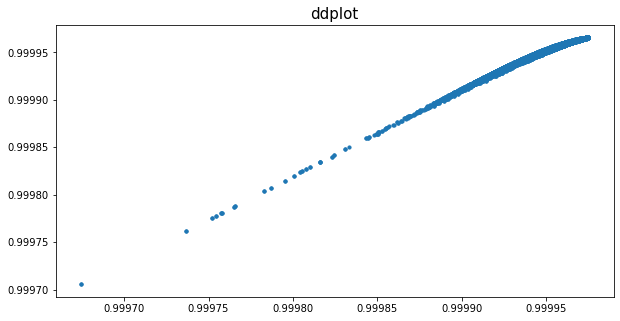

In [ ]:
ddplot(data2balance[data2balance['Y'] == 1], balanced_data_chol[balanced_data_chol['Y'] == 1], True)


In [ ]:
balanced_data_chol.columns

Index(['SALARIO', 'CUPO_TEORICO_ROT', 'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23', 'K_REGIONAL_27',
       'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_99', 'I_SEXO_F',
       'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO', 'I_ESTCIV_OTRO',
       'I_ESTCIV_SEPARADO', 'I_ESTCIV_UNION_LIBRE', 'Y'],
      dtype='object')

In [ ]:
balanced_data_chol.K_REGIONAL_23.value_counts()

0    34733
1     3895
Name: K_REGIONAL_23, dtype: int64

## Oversampling: Bootstrap ponderado

In [ ]:
n_data_a_generar = data_sin_na[data_sin_na['Y'] == 0].shape[0] - data_sin_na[data_sin_na['Y'] == 1].shape[0]
n_data_a_generar

17962

In [ ]:
# Calculo de la X empirica
data2oversample = data2balance[data2balance['Y'] == 1].copy()

# Nos quedamos solo con las variables dependientes
data2oversample = data2oversample.drop(['Y'], axis=1)

# data2oversample.info()

In [ ]:
# Armamos la matriz de frecuencias acumuladas
x_hat = data2oversample.apply(lambda i_col: i_col.apply(lambda val_i_col: np.mean(np.where(i_col<=val_i_col,1,0))))
x_hat.head()

,SALARIO,CUPO_TEORICO_ROT,TIENE_GARANTIA,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,...,K_REGIONAL_27,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE
19314,0.174556,0.589497,0.988905,0.368343,0.225592,0.400888,0.889053,0.304734,0.330621,0.139053,...,0.886834,0.860207,0.800296,0.934911,1.000000,0.883136,1.0,0.994822,0.994083,1.000000
19315,0.706361,0.985947,0.988905,1.000000,0.977071,0.446006,0.154586,0.181213,0.131657,0.071006,...,0.886834,1.000000,0.800296,0.934911,0.630917,0.883136,1.0,0.994822,0.994083,0.690089
19316,0.289201,0.589497,0.988905,1.000000,0.265533,0.724852,0.883136,0.642012,0.685651,0.673077,...,0.886834,0.860207,0.800296,0.934911,0.630917,0.883136,1.0,0.994822,0.994083,1.000000
19317,0.783284,0.589497,0.988905,1.000000,0.276627,0.925296,0.933432,0.657544,0.698964,0.903107,...,0.886834,0.860207,0.800296,0.934911,0.630917,0.883136,1.0,0.994822,0.994083,0.690089
19318,0.084320,0.589497,0.988905,1.000000,0.468195,0.464497,0.595414,0.411982,0.437870,0.383136,...,0.886834,0.860207,0.800296,0.934911,1.000000,0.883136,1.0,0.994822,0.994083,0.690089


In [ ]:
x_hat.columns

Index(['SALARIO', 'CUPO_TEORICO_ROT', 'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23', 'K_REGIONAL_27',
       'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_99', 'I_SEXO_F',
       'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO', 'I_ESTCIV_OTRO',
       'I_ESTCIV_SEPARADO', 'I_ESTCIV_UNION_LIBRE'],
      dtype='object')

In [ ]:
# freqs = data2oversample.apply(lambda i_col: print(i_col.name))
freqs = data2oversample.apply(lambda i_col: pd.cut(i_col, bins=8, include_lowest=False) if len(np.unique(i_col)) > 2 else pd.cut(i_col, bins=2, include_lowest=False))

# s, bins = pd.cut(pd.Series(np.arange(11)), bins = 5, retbins=True)



In [ ]:
# np.unique(freqs.MONTO_CRED_ACTUAL)
# freqs

In [ ]:
np.random.seed(55)
rand_ints = np.random.randint(x_hat.shape[0], size=n_data_a_generar)
rand_ints

array([461, 666, 295, ..., 936, 584, 907])

In [ ]:
grouped_freqs = [] # np.array([])
# grouped_freqsdf = pd.DataFrame() # columns = freqs.columns)
for freq_col in freqs.columns:
    grouped_freqs_col = freqs[freq_col].value_counts()
    # print(grouped_freqs_col)
    cumsum_percentage = grouped_freqs_col.cumsum()/grouped_freqs_col.sum()
    grouped_freqs.append(cumsum_percentage)
    # grouped_freqsdf[freq_col] = cumsum_percentage#.reset_index()
    # grouped_freqsdf = pd.concat([grouped_freqsdf, cumsum_percentage], axis=1)
    # print(type(cumsum_percentage))
    # print('----')

# freqs.MONTO_CRED_ACTUAL.value_counts().cumsum()

# grouped_freqs

In [ ]:
# grouped_freqs


In [ ]:
# rows_to_sample = [x_hat.iloc[x,:] for x in rand_ints[:10]]
# rows_to_sample = rand_ints[:10].apply(lambda x: x_hat.iloc[x,:])
rows_to_sample = x_hat.iloc[rand_ints,:]
rows_to_sample.head()

,SALARIO,CUPO_TEORICO_ROT,TIENE_GARANTIA,PROP_RET_HIST_X_EDAD,SALD_ROT_ANT__CUP_ROT,DEUDA_NO_ROT_ANT__SAL,CUOTAS_ANT__CAP,MORA_EXT__DEUDA_EXT,MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP,CUOTAS_EXT__CAP,...,K_REGIONAL_27,K_REGIONAL_40,K_REGIONAL_49,K_REGIONAL_99,I_SEXO_F,I_ESTCIV_CASADO,I_ESTCIV_DIVORCIADO,I_ESTCIV_OTRO,I_ESTCIV_SEPARADO,I_ESTCIV_UNION_LIBRE
19775,0.649408,0.589497,0.988905,1.000000,0.775888,0.488905,0.215976,0.956361,0.286982,0.295858,...,0.886834,0.860207,0.800296,0.934911,0.630917,0.883136,1.0,0.994822,0.994083,0.690089
19980,0.417899,0.589497,0.988905,0.368343,0.542899,0.795858,0.578402,0.494083,0.475592,0.517012,...,0.886834,0.860207,1.000000,0.934911,0.630917,1.000000,1.0,0.994822,0.994083,0.690089
19609,0.008136,0.589497,0.988905,1.000000,0.179734,0.389053,0.409024,0.911982,0.056213,0.195266,...,0.886834,0.860207,0.800296,0.934911,1.000000,0.883136,1.0,0.994822,0.994083,0.690089
20282,0.786243,0.897929,0.988905,1.000000,0.279586,0.407544,0.210059,0.409024,0.440089,0.148669,...,0.886834,0.860207,1.000000,0.934911,1.000000,0.883136,1.0,0.994822,0.994083,1.000000
19855,0.783284,0.589497,0.988905,1.000000,0.244822,0.022189,0.739645,0.942308,0.096893,0.501479,...,0.886834,0.860207,0.800296,0.934911,0.630917,0.883136,1.0,0.994822,0.994083,0.690089


In [ ]:
def simulate_a_record(vector_emp, col):
    #Vector a simular
    simulate_vector = []
    for i in range(col):
        #valor i-ésimo del vector de empíricas
        prop = vector_emp[i]
        #i-ésima tabla de frecuencias de los datos crudos
        freq_table = grouped_freqs[i]
        #Primer intervalo según valor prop
        interval = freq_table[freq_table>=prop].index[0]
        #Número aleatorio entre los límites de interval 
        rand = np.random.uniform(interval.left, interval.right, 1)
        #Agregar aleatorio a simulate_vector
        simulate_vector.append(rand)
    return np.array(simulate_vector)

In [ ]:
#Dimensiones
# _, col = rows_to_sample.shape
# 
# temp = rows_to_sample.iloc[:10].apply(lambda x: simulate_a_record(vector_emp=x, col=col), axis=1)
# 
# temp

In [ ]:
# simulate_a_record(vector_emp=rows_to_sample.iloc[0], col=col)

In [ ]:
indexes = {}
for col_i, col in enumerate(grouped_freqs):
    indexes[col.name] = col_i
print(indexes)

{'SALARIO': 0, 'CUPO_TEORICO_ROT': 1, 'TIENE_GARANTIA': 2, 'PROP_RET_HIST_X_EDAD': 3, 'SALD_ROT_ANT__CUP_ROT': 4, 'DEUDA_NO_ROT_ANT__SAL': 5, 'CUOTAS_ANT__CAP': 6, 'MORA_EXT__DEUDA_EXT': 7, 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP': 8, 'CUOTAS_EXT__CAP': 9, 'CUOTAS_EXT_NO_HIP__CAP': 10, 'SALARIO__EDAD': 11, 'CUPO_TEORICO_ROT__EDAD': 12, 'SALARIO__ANTIGÜEDAD': 13, 'CUPO_TEORICO_ROT__ANTIGÜEDAD': 14, 'K_REGIONAL_23': 15, 'K_REGIONAL_27': 16, 'K_REGIONAL_40': 17, 'K_REGIONAL_49': 18, 'K_REGIONAL_99': 19, 'I_SEXO_F': 20, 'I_ESTCIV_CASADO': 21, 'I_ESTCIV_DIVORCIADO': 22, 'I_ESTCIV_OTRO': 23, 'I_ESTCIV_SEPARADO': 24, 'I_ESTCIV_UNION_LIBRE': 25}


In [ ]:
rows_to_sample.shape

(17962, 26)

In [ ]:
sampled_data_bootstrap = rows_to_sample.apply(
    lambda row: row.apply(
        # Generar un dato random entre el intervalo
        # con el >= nos ubicamos en el intervalo que pega al dato de la distribucion empirica
        lambda row_val:
            (
                (1 if grouped_freqs[indexes[row.name]][grouped_freqs[indexes[row.name]]>=row_val].index[0].right == 1 else 0)
                if len(grouped_freqs[indexes[row.name]]) == 2 else (np.random.uniform(
                    grouped_freqs[indexes[row.name]][grouped_freqs[indexes[row.name]]>=row_val].index[0].left,
                    grouped_freqs[indexes[row.name]][grouped_freqs[indexes[row.name]]>=row_val].index[0].right,
                    1
                )[0])
                # np.random.uniform(
                #     grouped_freqs[indexes[row.name]][grouped_freqs[indexes[row.name]]>=row_val].index[0].left,
                #     grouped_freqs[indexes[row.name]][grouped_freqs[indexes[row.name]]>=row_val].index[0].right,
                #     1
                # )[0]
            )
            # print(grouped_freqs[indexes[row.name]][grouped_freqs[indexes[row.name]]>=row_val].index[0].right)
            # grouped_freqs[0][grouped_freqs[0]>=rows_to_sample.iloc[0][0]][0]
    )
)



#sampled_data_bootstrap


    
# grouped_freqs.MONTO_CRED_ACTUAL


In [ ]:
backup_sampled_data_bootstrap = sampled_data_bootstrap.copy()

In [ ]:
# sampled_data_bootstrap = backup_sampled_data_bootstrap

In [ ]:
sampled_data_bootstrap.columns

Index(['SALARIO', 'CUPO_TEORICO_ROT', 'TIENE_GARANTIA', 'PROP_RET_HIST_X_EDAD',
       'SALD_ROT_ANT__CUP_ROT', 'DEUDA_NO_ROT_ANT__SAL', 'CUOTAS_ANT__CAP',
       'MORA_EXT__DEUDA_EXT', 'MORA_EXT_NO_HIP__DEUDA_EXT_NO_HIP',
       'CUOTAS_EXT__CAP', 'CUOTAS_EXT_NO_HIP__CAP', 'SALARIO__EDAD',
       'CUPO_TEORICO_ROT__EDAD', 'SALARIO__ANTIGÜEDAD',
       'CUPO_TEORICO_ROT__ANTIGÜEDAD', 'K_REGIONAL_23', 'K_REGIONAL_27',
       'K_REGIONAL_40', 'K_REGIONAL_49', 'K_REGIONAL_99', 'I_SEXO_F',
       'I_ESTCIV_CASADO', 'I_ESTCIV_DIVORCIADO', 'I_ESTCIV_OTRO',
       'I_ESTCIV_SEPARADO', 'I_ESTCIV_UNION_LIBRE'],
      dtype='object')

In [ ]:
sampled_data_bootstrap['Y'] = 1

In [ ]:
balanced_data_bootstrap = data2balance.append(sampled_data_bootstrap, ignore_index=True)

In [ ]:
balanced_data_bootstrap['Y'].value_counts()

0    19314
1    19314
Name: Y, dtype: int64

,B0,B1,R2
Resultados,0.19603,0.803961,0.926231


(0.1960296580435007, array([0.80396086]), 0.926231342797996)

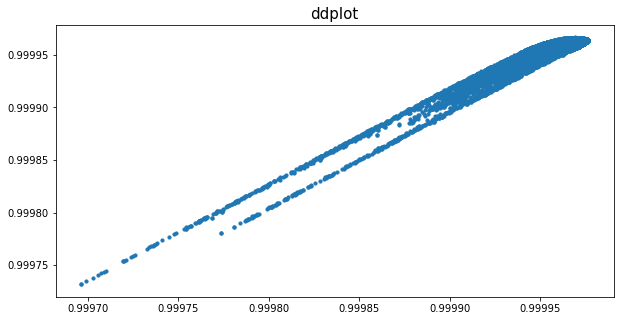

In [ ]:
ddplot(data2balance[data2balance['Y'] == 1], balanced_data_bootstrap[balanced_data_bootstrap['Y'] == 1], True)



In [ ]:
balanced_data_bootstrap.K_REGIONAL_23.value_counts()

0    36217
1     2411
Name: K_REGIONAL_23, dtype: int64

In [ ]:
# Excogemos la data de cholesky porque se parece más a la muestra inicial
balanced_data = balanced_data_chol.copy()

In [ ]:
# Exportar datos
balanced_data.to_excel('balanced_data.xlsx', index=False)

In [ ]:
# Leer el backup
# balanced_data = pd.read_excel('balanced_data.xlsx', sheet_name='Sheet1')

# Modelación

## Selección de características + C.V. + tunning de hiperparámetros

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tabulate import tabulate
import seaborn
import plotly.graph_objs as go
import plotly.offline as py
from plotly.subplots import make_subplots
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_score, recall_score

from sklearn import svm, datasets

# Data and plots
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Data preparation
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold

# Models
from sklearn import tree
from sklearn import svm
from sklearn import ensemble
from sklearn import neighbors
from sklearn import linear_model

# Metrics
from sklearn import metrics
# Export model
import pickle
#from sklearn.externals import joblib
# Random generators
from scipy.stats import uniform
# Permutation generators
import itertools

In [ ]:
data4train = balanced_data.copy()

In [ ]:
data4train['Y']

In [ ]:
X = data4train.drop(['Y'], axis=1)
Y = data4train['Y']

In [ ]:
def get_models(model, k, X, y):
    """
    Fit all possible models that contain exactly k predictors.
    """
    # List all available predictors
    X_combos = itertools.combinations(list(X.columns), k)
    
    # Fit all models accumulating score
    models = []
    
    for X_label in X_combos:
        #Train model
        temp_model = model.fit(X[list(X_label)], y)
        # Return results
        models += [(list(X_label), temp_model)]
    return models


def max_score(statsmodels, X, y):
    """Return model with highest score"""
    return sorted(statsmodels, reverse=True, key=lambda tup: tup[1].score(X, y))[0]

In [ ]:
def best_subset(model, X, y):
    """Perform best subset selection using Residual Sum of Squares to
    select best model in each subset.
    Notes: highly computationally expensive for large number of features in  X
    Maxes out my laptop for p > 14"""
    # get all model results
    model_subsets = []
    for k in range(len(X.columns)):
        k=k+1
        subset = get_models(model, k, X, y)
        model_subsets += [subset]
        print('Best subset selected: k = {}/{}, done'.format(k, len(X.columns)))
    # Get best rss score for each subset
    return [max_score(m, X, y) for m in model_subsets]

In [ ]:
# model = ensemble.GradientBoostingClassifier()
model = linear_model.LogisticRegression()

In [ ]:
best_subsets_full = best_subset(model, X, Y)

Best subset selected: k = 1/26, done
Best subset selected: k = 2/26, done


KeyboardInterrupt: 

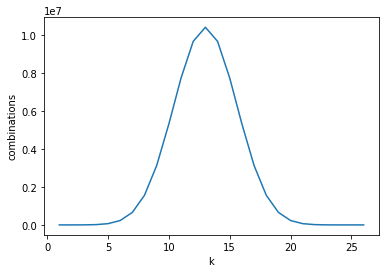

In [ ]:
# How does the number of possible combinations of the 8 features vary with k?
# Lets do a quick plot to find out!

from scipy.special import factorial

n = 26
k = np.arange(1, n+1)
y = factorial(n) / (factorial(k)*factorial(n-k))

ax = sns.lineplot(x=k, y=y)
plt.xlabel('k')
plt.ylabel('combinations');

In [ ]:
1e7

10000000.0

In [ ]:
k = 5
kfold = KFold(n_splits=k)

In [ ]:
X = df.iloc[:, :-1].values
y = df["Y"].values

print("X shape:\n", X.shape)
print("y shape:\n", y.shape)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=123)

print("X_train shape:\n", X_train.shape)
print("X_test shape:\n", X_test.shape)
print("y_train shape:\n", y_train.shape)
print("y_test shape:\n", y_test.shape)

X shape:
 (38628, 26)
y shape:
 (38628,)
X_train shape:
 (30902, 26)
X_test shape:
 (7726, 26)
y_train shape:
 (30902,)
y_test shape:
 (7726,)


In [ ]:
class_models = {"Logistic Reg.":linear_model.LogisticRegression,
             "Grad. Boosting":ensemble.GradientBoostingClassifier,
             "Rand. Forest":ensemble.RandomForestClassifier,
             "KNeig":neighbors.KNeighborsClassifier}

In [ ]:
params_models = {
    "Logistic Reg.":{'C': uniform(loc=0, scale=4), 'penalty': ('l2', 'l1','elasticnet'),
        'solver':('newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'),'multi_class':('auto', 'ovr', 'multinomial')},
    "Grad. Boosting":{'loss':('log_loss', 'exponential'),
        'criterion':('friedman_mse', 'squared_error', 'mse'),'max_features':('auto', 'sqrt', 'log2')},
    "Rand. Forest":{'criterion':('gini', 'entropy', 'log_loss'), 'max_features':('sqrt', 'log2', None),
        'class_weight':('balanced', 'balanced_subsample')},
    # "SVM":{'kernel':('linear', 'poly', 'rbf', 'sigmoid', 'precomputed'), 'C': uniform(loc=0, scale=4),'gamma':('scale', 'auto')},
    "KNeig":{'n_neighborsint':[5], 'weights':('uniform', 'distance'),'algorithm':('auto', 'ball_tree', 'kd_tree', 'brute')}
}

In [ ]:
uniform(loc=0, scale=4)

In [ ]:
class_models.items()

dict_items([('Logistic Reg.', <class 'sklearn.linear_model._logistic.LogisticRegression'>), ('Grad. Boosting', <class 'sklearn.ensemble._gb.GradientBoostingClassifier'>), ('Rand. Forest', <class 'sklearn.ensemble._forest.RandomForestClassifier'>), ('SVM', <class 'sklearn.svm._classes.SVC'>), ('KNeig', <class 'sklearn.neighbors._classification.KNeighborsClassifier'>)])

In [ ]:
X_train = data_sin_na.drop(columns='Y').values
y_train = data_sin_na['Y']

for name, model in class_models.items():
    print('name, params:') 
    print(name)
    print(params_models[name])

    model_rndmsearch = RandomizedSearchCV(
            estimator=model(),
            param_distributions=params_models[name],
            random_state=0,
            scoring='accuracy',
            n_iter=500,
            n_jobs=4,
            cv=10,
            refit=True,
            return_train_score=True)
    model_rndmsearch.fit(X_train, y_train)
    print('best_params_')
    print(model_rndmsearch.best_params_)
    # find best model score
    acc_score = model_rndmsearch.score(X_train, y_train)

    print("{} : {:,.3f}".format(name, acc_score))

name, params:
Logistic Reg.
{'C': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7ff4e34be390>, 'penalty': ('l2', 'l1', 'elasticnet'), 'solver': ('newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'), 'multi_class': ('auto', 'ovr', 'multinomial')}


KeyboardInterrupt: 

In [ ]:
data4corr #Esta ya cuenta con variables correlacionadas entre las X eliminadas

In [ ]:
#Chequear no na
df2.isna().sum().sum() == 0

True

In [ ]:
X2 = df2
y2 = data['Y']

## Regresión logística

In [ ]:
import itertools
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [ ]:
def get_models(k, X, y):
    """
    Fit all possible models that contain exactly k predictors.
    """
    # List all available predictors
    X_combos = itertools.combinations(list(X.columns), k)
    
    # Fit all models accumulating Residual Sum of Squares (RSS)
    models = []
    for X_label in X_combos:
        # Parse patsy formula
        X_smf = ' + '.join(X_label)
        f     = 'Y ~ {}'.format(X_smf)
        # Fit model
        model = smf.logit(formula=f, data=pd.concat([X, y], axis=1)).fit()
        # Return results
        models += [(f, model)]
    return models


def min_rss(statsmodels):
    """Return model with lowest Residual Sum of Squares (RSS)"""
    return sorted(statsmodels, key=lambda tup: tup[1].ssr)[0]


def max_adjr2(statsmodels):
    """Return model with lowest R-squared"""
    return sorted(statsmodels, reverse=True, key=lambda tup: tup[1].rsquared_adj)[0]

In [ ]:
# Set number ofr predictors in subset
k = 3

# Get all possible models in subset
subset = get_models(3, X2, y2)

# Display results
print('This model yields the lowest RSS score for the subset of models with {} predictors:'.format(k))
display(min_rss(subset))

print('This model yields the highest adjusted R-squared score for the subset of models with {} predictors:'.format(k))
max_adjr2(get_models(3, X2, y2))

NameError: name 'X2' is not defined

In [ ]:
# Pick subset of predictors 
X = data.drop(data[['ermsoft', "rmsoft", "rsandp", "inflation", "term"]], axis=1)
y = data['ermsoft']

In [ ]:
# get all model results
model_subsets = []
for k in range(len(X.columns)):
    k=k+1
    subset = get_models(k, X, y)
    model_subsets += [subset]
    print('Progess: k = {}, done'.format(k))

In [ ]:
# Get best rss score for each subset
rss   = [min_rss(m)[1].ssr for m in model_subsets]

# Get best r-squared score for each subset
adjr2 = [max_adjr2(m)[1].rsquared_adj for m in model_subsets]
k     = np.arange(1, len(rss)+1)


# Get best BIC
def min_bic(statsmodels):
    """Return model with lowest R-squared"""
    return sorted(statsmodels, reverse=False, key=lambda tup: tup[1].bic)[0]

bic = [min_bic(m)[1].bic for m in model_subsets]


ax = sns.lineplot(x=k, y=rss)
plt.xlabel('k')
plt.ylabel('rss')
plt.show()

sns.lineplot(x=k, y=adjr2)
plt.xlabel('k')
plt.ylabel('$R^2$')
plt.show()

sns.lineplot(x=k, y=bic)
plt.xlabel('k')
plt.ylabel('BIC')
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=b75135b0-45a9-410a-9365-2497f5e0433f' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>